## Scripts to create runoff plots for the provide regions

In [1]:
# updated script version for flattening gfdl-esm2m overshoot stabilisation scenarios from university of Bern 
from oggm import utils
import json
import oggm
import sys
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns
# get the correct colors for the different scenarios
from analysis_func import color_scenario, label_scenario, provide_reg_full_name_dict, color_scenario_poster

palette = sns.color_palette(color_scenario.values())

In [2]:
bc = 'bc_1980_2019' #'bc_1980_2019'
df_scenario = xr.open_dataset(f'common_running_sum_all_provide_reg_oversh_stab_2000_2500_bc_1980_2019.nc')

df_scenario['runoff_50_yr_avg'] = df_scenario.runoff.isel(time=slice(0,-1)).rolling(min_periods=50,
                                                                                    time=50, center=True).mean()
df_scenario_glob = df_scenario.sum(dim='provide_region', min_count=13)
pd_runoff_scenario_rel = (100*df_scenario/df_scenario.sel(time=2025)).runoff_50_yr_avg.to_dataframe('runoff_rel_2000_2050_%').reset_index()
pd_runoff_scenario_rel_glob = (100*df_scenario_glob/df_scenario_glob.sel(time=2025)).runoff_50_yr_avg.to_dataframe('runoff_rel_2000_2050_%').reset_index()


pd_clim_all = pd.read_csv('../annual_glob_rgi_reg_basin_temp_precip_timeseries_oversh_stab.csv',
                          index_col = 'Unnamed: 0')
pd_clim_all['precip_50yr_avg'] = pd_clim_all['precip'].rolling(50,center=True, min_periods=50).mean()
scenarios = list(color_scenario_poster.keys())
pd_clim_all['precip_50yr_avg'] = pd_clim_all['precip_50yr_avg'].where((pd_clim_all.year>=2025) & (pd_clim_all.year<=2474))


**First compute some provide region statistics**

In [45]:
pd_runoff_scenario_rel.provide_region.unique()

array(['P01', 'P02', 'P03', 'P04', 'P05', 'P06', 'P07', 'P08', 'P09',
       'P10', 'P11', 'P12', 'P13'], dtype=object)

In [52]:
# Definition:
# “Trough water” occurs if the 50-year average annual runoff from the 
#    “Overshoot 3.0°C -> 1.5°C” scenario is at least 5\% smaller than in the “Stabilisation 1.5°C”
# scenario for 20 years.
water_trough_stats = pd.DataFrame(index = ['global','P01', 'P02', 'P03', 'P04', 'P05', 'P06', 'P07', 'P08', 'P09',
       'P10', 'P11', 'P12', 'P13'],
                                  columns= ['yrs_with_water_trough',  'cumulative_runoff_diff_trough', 
                                            'water_trough_min_year', 'water_trough_max_diff',
                                            'water_trough_start_end'])
for Preg in water_trough_stats.index:
    if Preg == 'global':
        pd_runoff_scenario_rel_reg = pd_runoff_scenario_rel_glob
    else:
        pd_runoff_scenario_rel_reg = pd_runoff_scenario_rel.loc[pd_runoff_scenario_rel.provide_region==Preg]
    # overshoot runoff smaller than 0.95 times stabilisation runoff (both use 50yr avg. runoff)
    sel_oversh = pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.scenario=='oversh_T30OS15']
    sel_oversh.index = sel_oversh.time
    sel_stab = pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.scenario=='stab_T15']
    sel_stab.index = sel_stab.time
    condi = sel_stab['runoff_rel_2000_2050_%'] - sel_oversh['runoff_rel_2000_2050_%'] > 5 
    #difference has to be larger thatn 5% 

    # estimate years with water trough
    yrs_trough = sel_stab.where(condi).dropna(how='all').index
    if len(yrs_trough)==0:
        continue
    elif (yrs_trough[-1] - yrs_trough[0]) == len(yrs_trough):
        pass
    else:
        yrs_miss = list(set(np.arange(yrs_trough[0], yrs_trough[-1]))-set(yrs_trough))
        yrs_miss.sort()
        if len(yrs_miss)<1:
            pass
        elif (yrs_miss[-1] - yrs_trough[0] < 10):
            yrs_trough = np.arange(yrs_miss[-1]+1, yrs_trough[-1])
        elif (yrs_trough[-1] - yrs_miss[-1] < 10):
            yrs_trough = np.arange(yrs_trough[0], yrs_miss[-1]-1)
    # CONDITION: yrs_trough 
    if len(yrs_trough) <20:
        print(Preg, yrs_trough)
        yrs_trough = []
    # estimate runoff differences inside of water trough
    diff = (sel_stab.loc[yrs_trough]['runoff_rel_2000_2050_%'] - sel_oversh.loc[yrs_trough]['runoff_rel_2000_2050_%'])
    try:
        assert np.all(diff >0)
        water_trough_min_yr = int(diff.idxmax())
        water_trough_max_diff = diff.max()
        yrs_trough_start_end = f'{yrs_trough[0]}_{yrs_trough[-1]}'
    except:
        water_trough_min_yr = np.NaN
        water_trough_max_diff = np.NaN
        yrs_trough_start_end = np.NaN

    runoff_diff_trough = diff.sum()
    water_trough_stats.loc[Preg] = np.array([len(yrs_trough), runoff_diff_trough,
                                             water_trough_min_yr, water_trough_max_diff, yrs_trough_start_end])

P05 [2406. 2407. 2408. 2409. 2410. 2411. 2412. 2413. 2414. 2415.]
P11 []


In [50]:
water_trough_stats#.dropna()

,yrs_with_water_trough,cumulative_runoff_diff_trough,water_trough_min_year,water_trough_max_diff,water_trough_start_end
global,NaN,NaN,NaN,NaN,NaN
P01,NaN,NaN,NaN,NaN,NaN
P02,27,162.91495,2430,7.116218566894531,2415.0_2441.0
P03,45,338.4786,2270,9.574012756347656,2258.0_2302.0
P04,134,812.8479,2267,9.57855224609375,2151.0_2284.0
P05,0.0,0.0,NaN,NaN,NaN
P06,NaN,NaN,NaN,NaN,NaN
P07,67,385.5148,2197,6.947273254394531,2170.0_2236.0
P08,318,3208.5972,2171,17.0972900390625,2125.0_2443.0
P09,113,887.75574,2351,9.846305847167969,2275.0_2387.0


#### Figure for all Provide regions (runoff with precipitation, both 50-yr averaged)

no trough water: global
no trough water: P01
2415.0 2441.0
2258.0 2302.0
2151.0 2284.0
no trough water: P05
no trough water: P06
2170.0 2236.0
2125.0 2443.0
2275.0 2387.0
no trough water: P10
no trough water: P11
no trough water: P12
2337.0 2474.0


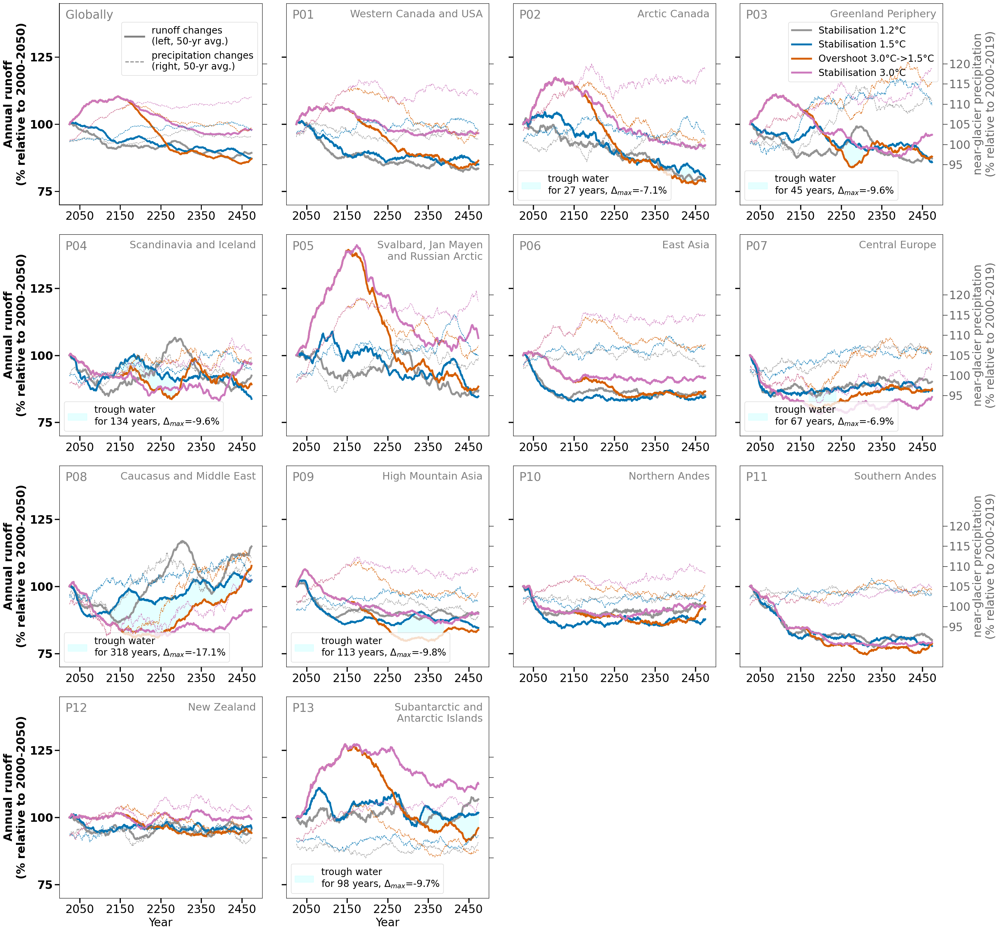

In [80]:
var = 'precip_50yr_avg'

plt.rc('font', size=24)

#plt.figure(figsize=(22,36)) #, sharey=True, sharex=True)
#plt.subplot(5,3,1)
plt.figure(figsize=(30,28)) #, sharey=True, sharex=True)
plt.subplot(4,4,1)
ax = plt.gca()
plt.text(0.03,0.97, 'Globally',
         transform=ax.transAxes,ha='left',va='top',
         color='grey', fontsize=25)
ax.set_ylabel('Annual runoff\n(% relative to 2000-2050)', weight='bold')

sns.lineplot(data=pd_runoff_scenario_rel_glob,
             hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
             palette=color_scenario_poster.values(),
             hue_order=scenarios,lw=4, legend=True,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in scenarios:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    if var == 'temp_20yr_avg':
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
    else:
        var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 1, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
if var != 'temp_20yr_avg':
    ticks = np.arange(95,125,5)
    ax2.set_yticks(ticks=ticks,
                    labels=ticks, alpha=0.6)  
else:
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)

ax2.set_ylim([85,135]);


plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
ax.set_ylim([70,145]);

# trough water 
try:
    y0,y1 = water_trough_stats['water_trough_start_end'].loc['global'].split('_')
    #pd__sel = pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_basin.basin == str(basin)].dropna()
    pd_preg_sel_stab_T15_runoff = pd_runoff_scenario_rel_glob.loc[pd_runoff_scenario_rel_glob.scenario=='stab_T15'] #['runoff_rel_2000_2050_%']
    pd_preg_sel_stab_T15_runoff.index = pd_preg_sel_stab_T15_runoff.time
    pd_preg_sel_oversh_T30OS15_runoff = pd_runoff_scenario_rel_glob.loc[pd_runoff_scenario_rel_glob.scenario=='oversh_T30OS15'] #['runoff_rel_2000_2050_%']
    pd_preg_sel_oversh_T30OS15_runoff.index = pd_preg_sel_oversh_T30OS15_runoff.time
    print(y0,y1)
    ax.fill_between(pd_preg_sel_stab_T15_runoff.loc[float(y0):float(y1)+1].time, 
                     pd_preg_sel_stab_T15_runoff.loc[float(y0):float(y1)+1]['runoff_rel_2000_2050_%'], 
                     pd_preg_sel_oversh_T30OS15_runoff.loc[float(y0):float(y1)+1]['runoff_rel_2000_2050_%'],
                     alpha = 0.1, color='cyan', zorder=-1)
except:
    print(f'no trough water: global')

### add legends
handles, labels = ax.get_legend_handles_labels()
ax.get_legend().remove()
handles_2, labels_2 = ax2.get_legend_handles_labels()
leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], fontsize=20, title_fontsize=22, bbox_to_anchor=(1,0.93), loc='upper right')
for l in leg.get_lines():
    l.set_linewidth(4)
leg2 = ax.legend([handles[0], handles_2[0]], ['runoff changes\n(left, 50-yr avg.)',
                                              f'precipitation changes\n(right, 50-yr avg.)'],
                 #loc='lower left',
                 ncol=1, fontsize=20,
                bbox_to_anchor=(1,0.93),
                        loc='upper right')
leg2.get_lines()[0].set_linewidth(4)
leg2.get_lines()[1].set_linewidth(2)
for l in leg2.get_lines():
    l.set_color('grey')
#ax.add_artist(leg)


for j, pi in enumerate(np.arange(1,14,1)):
    if pi<10:
        Preg = f'P0{pi}'
    else:
        Preg = f'P{pi}'
    plt.subplot(4,4,j+2)
    x_j = np.arange(3,15,4)
    x2_j = np.arange(2,15,4)
    year_xlabel_condi = j>10
    
    ax = plt.gca()
    if j == 2:
        leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)],
                        fontsize=20, title_fontsize=22, bbox_to_anchor=(1,0.93),
                        loc='upper right')
        for l in leg.get_lines():
            l.set_linewidth(4)
        #ax.add_artist(leg)

    pd_runoff_scenario_rel_reg = pd_runoff_scenario_rel.loc[pd_runoff_scenario_rel.provide_region==Preg]
    sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction==bc],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=list(color_scenario_poster.values()),
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
        
    plt.text(0.03,0.97, Preg,
                 transform=ax.transAxes,ha='left',va='top',
                 color='grey', fontsize=25)
    plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22)

    if j in x_j:
        plt.ylabel(f'Annual runoff\n(% relative to 2000-2050)', weight='bold')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')
    else:
        plt.ylabel('')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
        #plt.setp(ax.get_yticklabels(), visible=False)

    #ax.set_ylim([70,1439.9]);
    

    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'provide_reg_{Preg}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 1, 
                 ls = '--',
                 lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
    if var != 'temp_20yr_avg':
        ticks = np.arange(95,125,5)
        ax2.set_yticks(ticks=ticks,
                        labels=ticks, alpha=0.6)  
        ylabel = 'near-glacier precipitation\n(% relative to 2000-2019)'

    else:
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)
        ylabel = r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)'

    if j in x2_j:
        ax2.set_ylabel(ylabel,
                      alpha = 0.6)
        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    else:
        ax2.set_ylabel('')
        #ax2.set_yticks([])
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

    #ax2.set_ylim([-0.9,5.9]);
    ax2.set_ylim([85,135]);

    if j >10:
        ax.set_xlabel('Year')
    else:
        ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_ylim([70,145]);
    
    try:
        y0,y1 = water_trough_stats['water_trough_start_end'].loc[str(Preg)].split('_')
        #pd__sel = pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_basin.basin == str(basin)].dropna()
        pd_preg_sel_stab_T15_runoff = pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.scenario=='stab_T15'] #['runoff_rel_2000_2050_%']
        pd_preg_sel_stab_T15_runoff.index = pd_preg_sel_stab_T15_runoff.time
        pd_preg_sel_oversh_T30OS15_runoff = pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.scenario=='oversh_T30OS15'] #['runoff_rel_2000_2050_%']
        pd_preg_sel_oversh_T30OS15_runoff.index = pd_preg_sel_oversh_T30OS15_runoff.time
        print(y0,y1)
        nyears,water_trough_max_diff  = water_trough_stats[['yrs_with_water_trough',
                                                    'water_trough_max_diff']].loc[str(Preg)]
        water_trough_max_diff = np.round(float(water_trough_max_diff),1)
        add_label = f'for {nyears} years, ' + r'$\Delta_{max}$=-'+f'{water_trough_max_diff}%'
        ax.fill_between(pd_preg_sel_stab_T15_runoff.loc[float(y0):float(y1)+1].time, 
                         pd_preg_sel_stab_T15_runoff.loc[float(y0):float(y1)+1]['runoff_rel_2000_2050_%'], 
                         pd_preg_sel_oversh_T30OS15_runoff.loc[float(y0):float(y1)+1]['runoff_rel_2000_2050_%'],
                         alpha = 0.1, color='cyan', zorder=-1, 
                        label = 'trough water\n'+add_label)
        handles_x, labels_x = ax.get_legend_handles_labels()
        leg3 = ax.legend([handles_x[-1]], [labels_x[-1]],
                         loc='lower left',fontsize=20)
        if j ==2:
            ax.add_artist(leg)

    except:
        print(f'no trough water: {Preg}')


plt.tight_layout()

plt.savefig(f'figures/3_provide_reg_runoff_{bc}_vs_prcp_portrait_4cols_precip50yr_avg.pdf')
plt.savefig(f'figures/3_provide_reg_runoff_{bc}_vs_prcp_portrait_4cols_precip50yr_avg.png')

### OLD ???

In [ ]:
pd_vol_scenario_rel = (100*df_scenario/df_scenario.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()
pd_vol_scenario_glob = (100*df_scenario_glob/df_scenario_glob.sel(time=2020)).volume.to_dataframe('volume_rel_2020_%').reset_index()


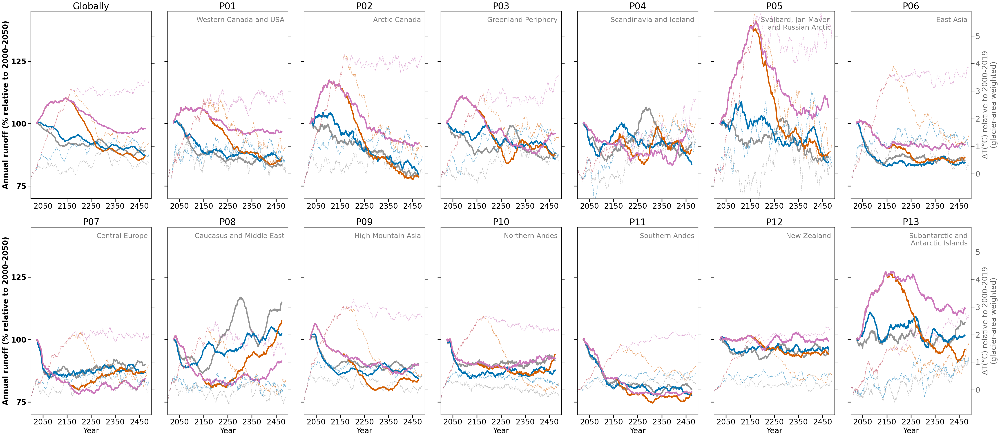

In [4]:
var = 'temp_20yr_avg'

plt.rc('font', size=24)

plt.figure(figsize=(45,20)) #, sharey=True, sharex=True)
plt.subplot(2,7,1)
ax = plt.gca()
ax.set_title('Globally')

ax.set_ylabel('Annual runoff (% relative to 2000-2050)', weight='bold')

sns.lineplot(data=pd_runoff_scenario_rel_glob,
             hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
             palette=color_scenario_poster.values(),
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in scenarios:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 0.6, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)
ax2.set_ylim([-0.9,5.9]);

plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
ax.set_ylim([70,145]);

for j, pi in enumerate(np.arange(1,14,1)):
    if pi<10:
        Preg = f'P0{pi}'
    else:
        Preg = f'P{pi}'
    plt.subplot(2,7,j+2)
    ax = plt.gca()
    pd_runoff_scenario_rel_reg = pd_runoff_scenario_rel.loc[pd_runoff_scenario_rel.provide_region==Preg]
    sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction==bc],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=list(color_scenario_poster.values()),
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
    
    ax.set_title(f'{Preg}')
    plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22)

    if j in [6]:
        plt.ylabel(f'Annual runoff (% relative to 2000-2050)', weight='bold')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')
    else:
        plt.ylabel('')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
        #plt.setp(ax.get_yticklabels(), visible=False)

    #ax.set_ylim([70,1439.9]);
    

    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'provide_reg_{Preg}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 0.6, 
                 ls = '--',
                 lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
    
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)
    if j in [5,12]:
        ax2.set_ylabel(r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)',
                      alpha = 0.6)
        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    else:
        ax2.set_ylabel('')
        #ax2.set_yticks([])
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

    ax2.set_ylim([-0.9,5.9]);
    if j >5:
        ax.set_xlabel('Year')
    else:
        ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_ylim([70,145]);
plt.tight_layout()
plt.savefig(f'provide_reg_runoff_{bc}.pdf')

**same but instead for 20-yr average precipitation**:

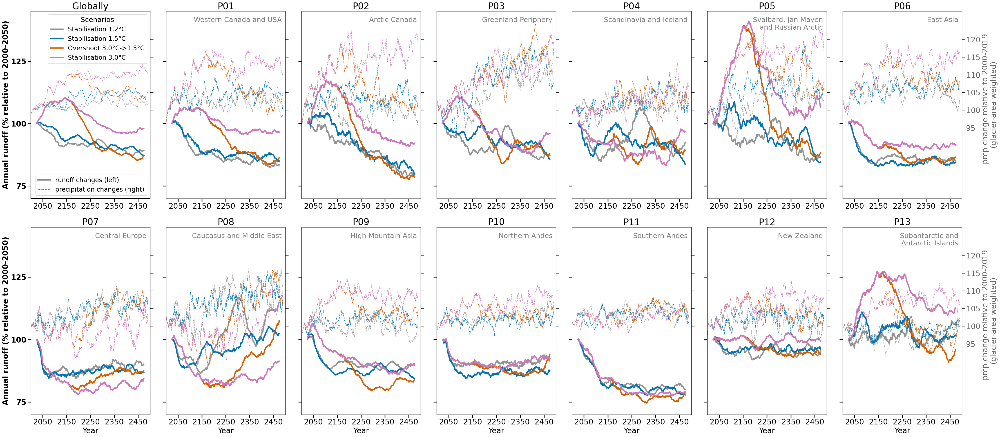

In [6]:
var = 'precip_20yr_avg'

plt.rc('font', size=24)

plt.figure(figsize=(45,20)) #, sharey=True, sharex=True)
plt.subplot(2,7,1)
ax = plt.gca()
ax.set_title('Globally')

ax.set_ylabel('Annual runoff (% relative to 2000-2050)', weight='bold')

sns.lineplot(data=pd_runoff_scenario_rel_glob,
             hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
             palette=color_scenario_poster.values(),
             hue_order=scenarios,lw=4, legend=True,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in scenarios:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    if var == 'temp_20yr_avg':
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
    else:
        var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 1, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
if var != 'temp_20yr_avg':
    ticks = np.arange(95,125,5)
    ax2.set_yticks(ticks=ticks,
                    labels=ticks, alpha=0.6)  
else:
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)

ax2.set_ylim([75,128]);
plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
ax.set_ylim([70,145]);


### add legends
handles, labels = ax.get_legend_handles_labels()
ax.get_legend().remove()
handles_2, labels_2 = ax2.get_legend_handles_labels()
leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], title='Scenarios', fontsize=20, title_fontsize=22)
for l in leg.get_lines():
    l.set_linewidth(4)
leg2 = ax.legend([handles[0], handles_2[0]], ['runoff changes (left)',
                                              r'precipitation changes (right)'],
                 loc='lower right', ncol=1, fontsize=20)
leg2.get_lines()[0].set_linewidth(4)
leg2.get_lines()[1].set_linewidth(2)
for l in leg2.get_lines():
    l.set_color('grey')
ax.add_artist(leg)


for j, pi in enumerate(np.arange(1,14,1)):
    if pi<10:
        Preg = f'P0{pi}'
    else:
        Preg = f'P{pi}'
    plt.subplot(2,7,j+2)
    ax = plt.gca()
    pd_runoff_scenario_rel_reg = pd_runoff_scenario_rel.loc[pd_runoff_scenario_rel.provide_region==Preg]
    sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction==bc],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=list(color_scenario_poster.values()),
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
    
    ax.set_title(f'{Preg}')
    plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22)

    if j in [6]:
        plt.ylabel(f'Annual runoff (% relative to 2000-2050)', weight='bold')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')
    else:
        plt.ylabel('')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
        #plt.setp(ax.get_yticklabels(), visible=False)

    #ax.set_ylim([70,1439.9]);
    

    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'provide_reg_{Preg}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 1, 
                 ls = '--',
                 lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
    if var != 'temp_20yr_avg':
        ticks = np.arange(95,125,5)
        ax2.set_yticks(ticks=ticks,
                        labels=ticks, alpha=0.6)  
        ylabel = '     prcp change relative to 2000-2019\n(glacier-area weighted)'

    else:
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)
        ylabel = r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)'

    if j in [5,12]:
        ax2.set_ylabel(ylabel,
                      alpha = 0.6)
        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    else:
        ax2.set_ylabel('')
        #ax2.set_yticks([])
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

    #ax2.set_ylim([-0.9,5.9]);
    ax2.set_ylim([75,128]);

    if j >5:
        ax.set_xlabel('Year')
    else:
        ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_ylim([70,145]);
plt.tight_layout()
plt.savefig(f'3_provide_reg_runoff_{bc}_vs_prcp_poster_iugg.pdf')
plt.savefig(f'3_provide_reg_runoff_{bc}_vs_prcp_poster_iugg.png')

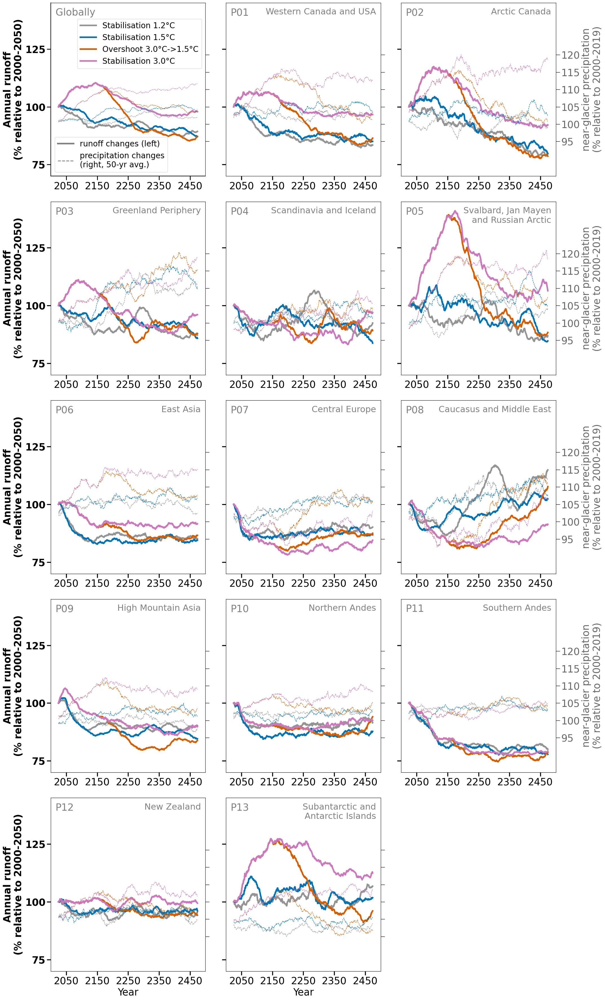

In [24]:
var = 'precip_50yr_avg'

plt.rc('font', size=25)

plt.figure(figsize=(22,36)) #, sharey=True, sharex=True)
plt.subplot(5,3,1)
ax = plt.gca()
plt.text(0.03,0.97, 'Globally',
         transform=ax.transAxes,ha='left',va='top',
         color='grey', fontsize=25)
ax.set_ylabel('Annual runoff\n(% relative to 2000-2050)', weight='bold')

sns.lineplot(data=pd_runoff_scenario_rel_glob,
             hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
             palette=color_scenario_poster.values(),
             hue_order=scenarios,lw=4, legend=True,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in scenarios:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    if var == 'temp_20yr_avg':
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
    else:
        var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 1, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
if var != 'temp_20yr_avg':
    ticks = np.arange(95,125,5)
    ax2.set_yticks(ticks=ticks,
                    labels=ticks, alpha=0.6)  
else:
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)

ax2.set_ylim([85,135]);


plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
ax.set_ylim([70,145]);


### add legends
handles, labels = ax.get_legend_handles_labels()
ax.get_legend().remove()
handles_2, labels_2 = ax2.get_legend_handles_labels()
leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], fontsize=20, title_fontsize=22, bbox_to_anchor=(1,0.93), loc='upper right')
for l in leg.get_lines():
    l.set_linewidth(4)
leg2 = ax.legend([handles[0], handles_2[0]], ['runoff changes (left)',
                                              f'precipitation changes\n(right, 50-yr avg.)'],
                 loc='lower left', ncol=1, fontsize=20)
leg2.get_lines()[0].set_linewidth(4)
leg2.get_lines()[1].set_linewidth(2)
for l in leg2.get_lines():
    l.set_color('grey')
ax.add_artist(leg)


for j, pi in enumerate(np.arange(1,14,1)):
    if pi<10:
        Preg = f'P0{pi}'
    else:
        Preg = f'P{pi}'
    plt.subplot(5,3,j+2)
    x_j = np.arange(2,15,3)
    x2_j = np.arange(1,15,3)
    year_xlabel_condi = j>10
    
    ax = plt.gca()
    pd_runoff_scenario_rel_reg = pd_runoff_scenario_rel.loc[pd_runoff_scenario_rel.provide_region==Preg]
    sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction==bc],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=list(color_scenario_poster.values()),
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
        
    plt.text(0.03,0.97, Preg,
                 transform=ax.transAxes,ha='left',va='top',
                 color='grey', fontsize=25)
    plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22)

    if j in x_j:
        plt.ylabel(f'Annual runoff\n(% relative to 2000-2050)', weight='bold')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')
    else:
        plt.ylabel('')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
        #plt.setp(ax.get_yticklabels(), visible=False)

    #ax.set_ylim([70,1439.9]);
    

    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'provide_reg_{Preg}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 1, 
                 ls = '--',
                 lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
    if var != 'temp_20yr_avg':
        ticks = np.arange(95,125,5)
        ax2.set_yticks(ticks=ticks,
                        labels=ticks, alpha=0.6)  
        ylabel = 'near-glacier precipitation\n(% relative to 2000-2019)'

    else:
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)
        ylabel = r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)'

    if j in x2_j:
        ax2.set_ylabel(ylabel,
                      alpha = 0.6)
        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    else:
        ax2.set_ylabel('')
        #ax2.set_yticks([])
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

    #ax2.set_ylim([-0.9,5.9]);
    ax2.set_ylim([85,135]);

    if j >10:
        ax.set_xlabel('Year')
    else:
        ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_ylim([70,145]);
plt.tight_layout()
plt.savefig(f'3_provide_reg_runoff_{bc}_vs_prcp_poster_iugg_portrait_3col_precip50yr_avg.pdf')
plt.savefig(f'3_provide_reg_runoff_{bc}_vs_prcp_poster_iugg_portrait_3col_precip50yr_avg.png')

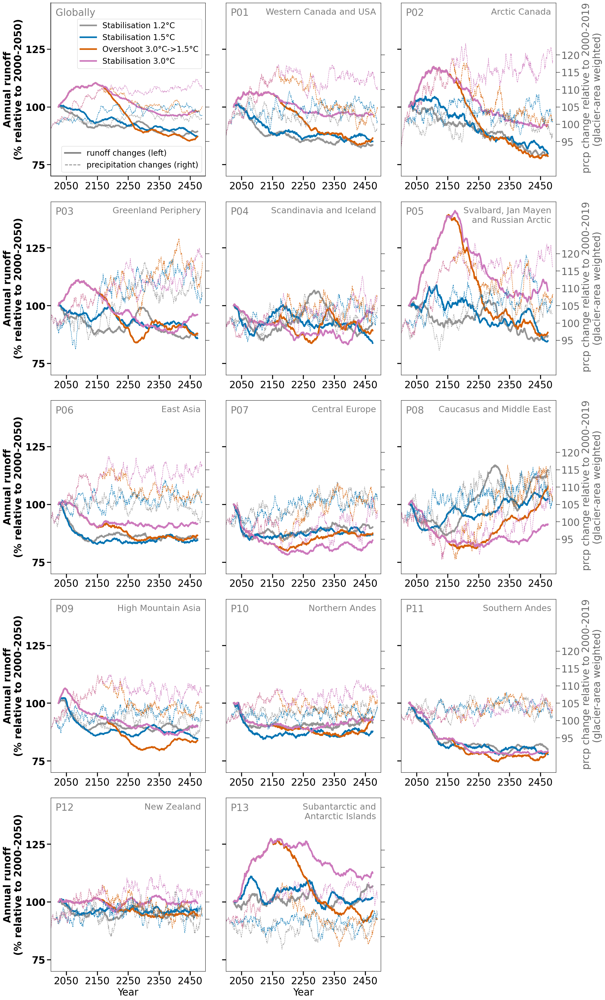

In [7]:
var = 'precip_20yr_avg'

plt.rc('font', size=25)

plt.figure(figsize=(22,36)) #, sharey=True, sharex=True)
plt.subplot(5,3,1)
ax = plt.gca()
plt.text(0.03,0.97, 'Globally',
         transform=ax.transAxes,ha='left',va='top',
         color='grey', fontsize=25)
ax.set_ylabel('Annual runoff\n(% relative to 2000-2050)', weight='bold')

sns.lineplot(data=pd_runoff_scenario_rel_glob,
             hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
             palette=color_scenario_poster.values(),
             hue_order=scenarios,lw=4, legend=True,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in scenarios:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == 'global_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    if var == 'temp_20yr_avg':
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
    else:
        var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 1, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
if var != 'temp_20yr_avg':
    ticks = np.arange(95,125,5)
    ax2.set_yticks(ticks=ticks,
                    labels=ticks, alpha=0.6)  
else:
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)

ax2.set_ylim([85,135]);


plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
ax.set_ylim([70,145]);


### add legends
handles, labels = ax.get_legend_handles_labels()
ax.get_legend().remove()
handles_2, labels_2 = ax2.get_legend_handles_labels()
leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], fontsize=20, title_fontsize=22, bbox_to_anchor=(1,0.93), loc='upper right')
for l in leg.get_lines():
    l.set_linewidth(4)
leg2 = ax.legend([handles[0], handles_2[0]], ['runoff changes (left)',
                                              r'precipitation changes (right)'],
                 loc='lower right', ncol=1, fontsize=20)
leg2.get_lines()[0].set_linewidth(4)
leg2.get_lines()[1].set_linewidth(2)
for l in leg2.get_lines():
    l.set_color('grey')
ax.add_artist(leg)


for j, pi in enumerate(np.arange(1,14,1)):
    if pi<10:
        Preg = f'P0{pi}'
    else:
        Preg = f'P{pi}'
    plt.subplot(5,3,j+2)
    x_j = np.arange(2,15,3)
    x2_j = np.arange(1,15,3)
    year_xlabel_condi = j>10
    
    ax = plt.gca()
    pd_runoff_scenario_rel_reg = pd_runoff_scenario_rel.loc[pd_runoff_scenario_rel.provide_region==Preg]
    sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction==bc],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=list(color_scenario_poster.values()),
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)
        
    plt.text(0.03,0.97, Preg,
                 transform=ax.transAxes,ha='left',va='top',
                 color='grey', fontsize=25)
    plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22)

    if j in x_j:
        plt.ylabel(f'Annual runoff\n(% relative to 2000-2050)', weight='bold')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], weight='bold')
    else:
        plt.ylabel('')
        ax.set_yticks(ticks=[0,25,50,75,100,125],
                   labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
        #plt.setp(ax.get_yticklabels(), visible=False)

    #ax.set_ylim([70,1439.9]);
    

    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'provide_reg_{Preg}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 1, 
                 ls = '--',
                 lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
    if var != 'temp_20yr_avg':
        ticks = np.arange(95,125,5)
        ax2.set_yticks(ticks=ticks,
                        labels=ticks, alpha=0.6)  
        ylabel = ' prcp change relative to 2000-2019\n(glacier-area weighted)'

    else:
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)
        ylabel = r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)'

    if j in x2_j:
        ax2.set_ylabel(ylabel,
                      alpha = 0.6)
        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    else:
        ax2.set_ylabel('')
        #ax2.set_yticks([])
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

    #ax2.set_ylim([-0.9,5.9]);
    ax2.set_ylim([85,135]);

    if j >10:
        ax.set_xlabel('Year')
    else:
        ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_ylim([70,145]);
plt.tight_layout()
plt.savefig(f'3_provide_reg_runoff_{bc}_vs_prcp_poster_iugg_portrait_3col.pdf')
plt.savefig(f'3_provide_reg_runoff_{bc}_vs_prcp_poster_iugg_portrait_3col.png')

In [6]:
water_trough_stats.dropna()

,yrs_with_water_trough,cumulative_runoff_diff_trough,water_trough_min_year,water_trough_max_diff,water_trough_start_end
P02,27,162.91495,2430,7.116218566894531,2415.0_2441.0
P03,45,338.4786,2270,9.574012756347656,2258.0_2302.0
P04,134,812.8479,2267,9.57855224609375,2151.0_2284.0
P05,10,58.881798,2410,6.41455078125,2406.0_2415.0
P07,67,385.5148,2197,6.947273254394531,2170.0_2236.0
P08,318,3208.5972,2171,17.0972900390625,2125.0_2443.0
P09,113,887.75574,2351,9.846305847167969,2275.0_2387.0
P13,98,729.91064,2451,9.674903869628906,2337.0_2474.0


In [7]:
water_trough_stats.dropna().loc[water_trough_stats.dropna().yrs_with_water_trough.astype(int)>50]

,yrs_with_water_trough,cumulative_runoff_diff_trough,water_trough_min_year,water_trough_max_diff,water_trough_start_end
P04,134,812.8479,2267,9.57855224609375,2151.0_2284.0
P07,67,385.5148,2197,6.947273254394531,2170.0_2236.0
P08,318,3208.5972,2171,17.0972900390625,2125.0_2443.0
P09,113,887.75574,2351,9.846305847167969,2275.0_2387.0
P13,98,729.91064,2451,9.674903869628906,2337.0_2474.0


In [8]:
water_trough_stats.loc[Preg]

yrs_with_water_trough            NaN
cumulative_runoff_diff_trough    NaN
water_trough_min_year            NaN
water_trough_max_diff            NaN
water_trough_start_end           NaN
Name: P01, dtype: object

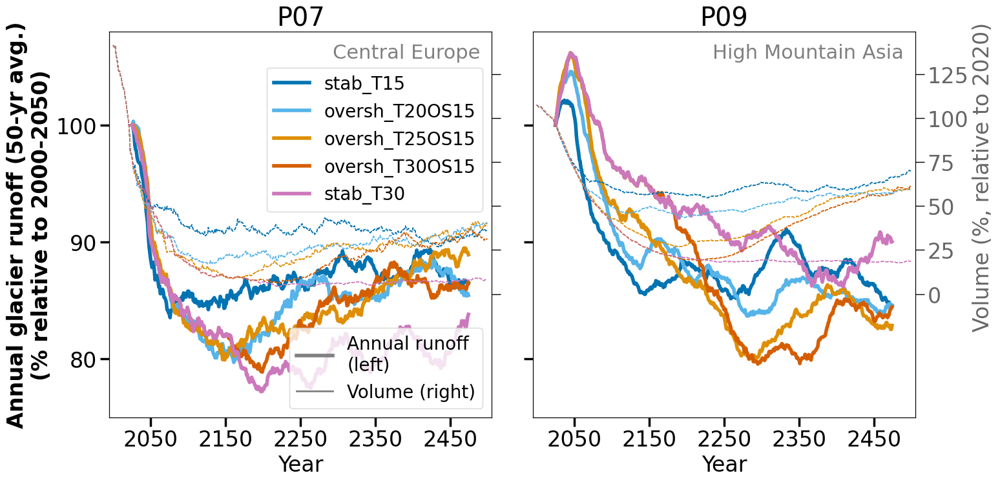

In [38]:
var = 'temp_20yr_avg'

plt.rc('font', size=24)

plt.figure(figsize=(16,8)) #, sharey=True, sharex=True)

for j, Preg in enumerate(['P07', 'P09']):
    plt.subplot(1,2,j+1)
    ax = plt.gca()
    pd_runoff_scenario_rel_reg = pd_runoff_scenario_rel.loc[pd_runoff_scenario_rel.provide_region==Preg]
    sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction==bc],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=color_scenario_poster.values(),
             hue_order=scenarios,lw=4, legend=True,
             ax = ax)
    
    ax.set_title(f'{Preg}')
    plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22)

    plt.ylabel(f'Annual glacier runoff (50-yr avg.)\n(% relative to 2000-2050)', weight='bold')
    ax.set_yticks(np.arange(70,125,10), weight='bold')
   

    ax.set_ylim([75,108]);

    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    
    #####################
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:
        pd_vol_scenario_rel_reg = pd_vol_scenario_rel.loc[pd_vol_scenario_rel.provide_region==Preg]
        sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction=='bc_2000_2019'],
                     hue='scenario', x='time', y= 'volume_rel_2020_%', 
                     palette=color_scenario_poster.values(),
                 hue_order=scenarios, legend=True,
                 ax = ax2, lw=1, alpha = 0.6, ls='--')
        

    

        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    

    ax2.set_ylim([-70,149]);
    ax2.set_yticks([0,25,50,75,100], [0,25,50,75,100])
    ax.set_xlabel('Year')

    ax.set_xlim([1995,2505])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([1995,2505])
    ax2.set_yticks(ticks=[0,25,50,75,100,125],
               labels=[0,25,50,75,100,125], alpha=0.6)
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    
    if j ==1:
        ax2.set_ylabel(f'              Volume (%, relative to 2020)',
                      alpha = 0.6)
        ax.set_ylabel('')
        plt.setp(ax.get_yticklabels(), visible=False, fontsize=1)
    else:
        ax2.set_ylabel('')
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
        ax.set_ylabel(f'Annual glacier runoff (50-yr avg.)\n(% relative to 2000-2050)', weight='bold')
        
        
    if j ==0:
        ### add legends
        handles, labels = ax.get_legend_handles_labels()
        ax.get_legend().remove()
        # we take label_2 and handles_2 from the plots above
        handles_2, _ = ax2.get_legend_handles_labels()
        ax2.get_legend().remove()
        leg = ax.legend(handles[:len(scenarios)], scenarios, fontsize=20, loc = 'upper right', bbox_to_anchor=(1,0.93))
        for l in leg.get_lines():
            l.set_linewidth(4)
            
        leg2 = ax.legend([handles[0], handles_2[0]],
                  ['Annual runoff\n(left)', 'Volume '+'(right)'], loc='lower right', fontsize=20, ncol=1)
        leg2.get_lines()[0].set_linewidth(4)
        leg2.get_lines()[1].set_linewidth(1)
        for l in leg2.get_lines():
            l.set_color('grey')
            l.set_linestyle('--')
        ax.add_artist(leg)
    else:
        ax.get_legend().remove()
        ax2.get_legend().remove()

plt.tight_layout()
#plt.savefig('test_provide_reg_runoff_select_vol.pdf')

### Seasonal runoff

In [68]:
df_scenario.runoff_monthly

<xarray.DataArray 'runoff_monthly' (provide_region: 13, scenario: 7, gcm: 1,
                                    time: 500, month_2d: 12)>
array([[[[[1.915836e+08, ..., 1.306573e+11],
          ...,
          [0.000000e+00, ..., 0.000000e+00]]],


        ...,


        [[[1.915836e+08, ..., 1.306573e+11],
          ...,
          [0.000000e+00, ..., 0.000000e+00]]]],



       ...,



       [[[[7.450181e+13, ..., 4.518779e+13],
          ...,
          [0.000000e+00, ..., 0.000000e+00]]],


        ...,


        [[[7.450181e+13, ..., 4.518779e+13],
          ...,
          [0.000000e+00, ..., 0.000000e+00]]]]], dtype=float32)
Coordinates:
  * time               (time) float64 2e+03 2.001e+03 ... 2.498e+03 2.499e+03
    hydro_year         (time) int64 2000 2001 2002 2003 ... 2496 2497 2498 2499
    hydro_month        (provide_region, time) int64 4 4 4 4 4 ... 10 10 10 10 10
    calendar_year      (time) int64 2000 2001 2002 2003 ... 2496 2497 2498 2499
    calendar_month     (time) int64 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1
  * month_2d           (month_2d) int64 1 2 3 4 5 6 7 8 9 10 11 12
    calendar_month_2d  (month_2d) int64 1 2 3 4 5 6 7 8 9 10 11 12
  * gcm                (gcm) object 'GFDL-ESM2M'
  * scenario           (scenario) object 'oversh_T20OS15' ... 'stab_T30'
    bias_correction    <U12 'bc_1980_2019'
  * provide_region     (provide_region) object 'P01' 'P02' 'P03' ... 'P12' 'P13'
    OGGM_version       <U22 'OGGM_v161_gdirs_2023.3'

In [8]:
bc = 'bc_1980_2019' #'bc_2000_2019'
#df_scenario = xr.open_dataset('filled_sum_all_provide_reg_oversh_stab_2000_2500.nc').sel(bias_correction=bc)
df_scenario['runoff_m_50_yr_avg'] = df_scenario.runoff_monthly.isel(time=slice(0,-1)).rolling(min_periods=50, time=50, center=True).mean()

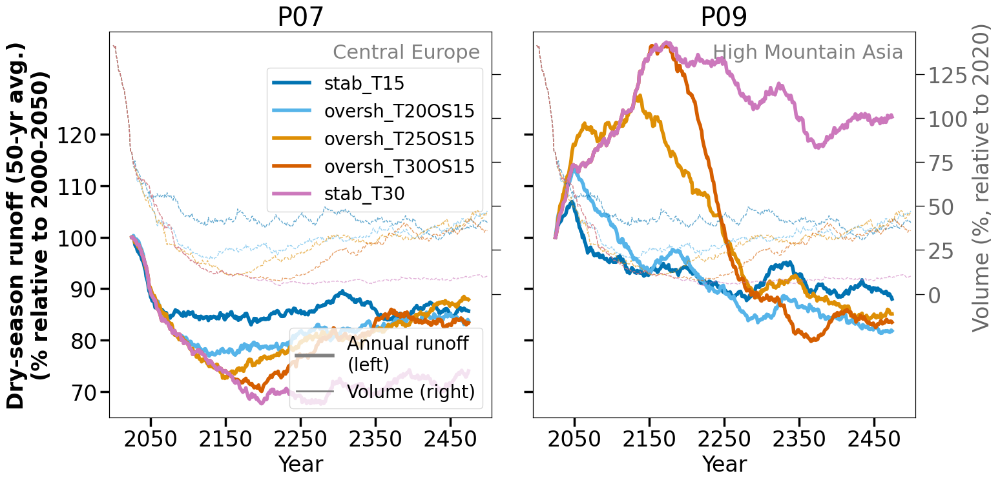

In [89]:
var = 'temp_20yr_avg'

plt.rc('font', size=24)

plt.figure(figsize=(16,8)) #, sharey=True, sharex=True)

for j, Preg in enumerate(['P07', 'P09']):
    plt.subplot(1,2,j+1)
    ax = plt.gca()
    if Preg in ['P09']:
        # in summer monsoon, driest months are Mar-May, Sep-Nov
        dry_m = [3,4,5,9,10,11] #[6,7,8,9] #[1,2,12] #[3,4,5,9,10,11] #[1,2,12] #
    else:
        dry_m = [6,7,8,9]
    df_scenario_m_sel = df_scenario.sel(provide_region=Preg)
    df_scenario_m_sel = df_scenario_m_sel.sel(month_2d =dry_m)
    #print(df_scenario_m_sel.month_2d)
    df_scenario_m_sel = df_scenario_m_sel.sum(dim='month_2d', skipna=True, min_count=len(dry_m))
    pd_runoff_scenario_rel_reg = (100*df_scenario_m_sel/df_scenario_m_sel.sel(time=2025)).runoff_m_50_yr_avg.to_dataframe('runoff_rel_2000_2050_%').reset_index()

    sns.lineplot(data=pd_runoff_scenario_rel_reg.loc[pd_runoff_scenario_rel_reg.bias_correction==bc],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=color_scenario_poster.values(),
             hue_order=scenarios,lw=4, legend=True,
             ax = ax)
    
    ax.set_title(f'{Preg}')
    plt.text(0.97,0.97, provide_reg_full_name_dict[Preg],
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22)

    plt.ylabel(f'Dry-season runoff (50-yr avg.)\n(% relative to 2000-2050)', weight='bold')
    ax.set_yticks(np.arange(70,125,10), weight='bold')
   

    ax.set_ylim([65,140]);

    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    
    #####################
    ax2 = ax.twinx()  
    #for scenario in scenarios:
    #                #'stab_T30']:
    sns.lineplot(data=pd_vol_scenario_rel_reg.loc[pd_vol_scenario_rel_reg.bias_correction==bc],
                 hue='scenario', x='time', y= 'volume_rel_2020_%', 
                 palette=color_scenario_poster.values(),
             hue_order=scenarios, legend=True,
             ax = ax2, lw=1, alpha = 0.6, ls='--')
        

    

        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    

    ax2.set_ylim([-70,149]);
    ax2.set_yticks([0,25,50,75,100], [0,25,50,75,100])
    ax.set_xlabel('Year')

    ax.set_xlim([1995,2505])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([1995,2505])
    ax2.set_yticks(ticks=[0,25,50,75,100,125],
               labels=[0,25,50,75,100,125], alpha=0.6)
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    
    if j ==1:
        ax2.set_ylabel(f'              Volume (%, relative to 2020)',
                      alpha = 0.6)
        ax.set_ylabel('')
        plt.setp(ax.get_yticklabels(), visible=False, fontsize=1)
    else:
        ax2.set_ylabel('')
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
        ax.set_ylabel(f'Dry-season runoff (50-yr avg.)\n(% relative to 2000-2050)', weight='bold')
        
        
    if j ==0:
        ### add legends
        handles, labels = ax.get_legend_handles_labels()
        ax.get_legend().remove()
        # we take label_2 and handles_2 from the plots above
        handles_2, _ = ax2.get_legend_handles_labels()
        ax2.get_legend().remove()
        leg = ax.legend(handles[:len(scenarios)], scenarios, fontsize=20, loc = 'upper right', bbox_to_anchor=(1,0.93))
        for l in leg.get_lines():
            l.set_linewidth(4)
            
        leg2 = ax.legend([handles[0], handles_2[0]],
                  ['Annual runoff\n(left)', 'Volume '+'(right)'], loc='lower right', fontsize=20, ncol=1)
        leg2.get_lines()[0].set_linewidth(4)
        leg2.get_lines()[1].set_linewidth(2)
        for l in leg2.get_lines():
            l.set_color('grey')
        ax.add_artist(leg)
    else:
        ax.get_legend().remove()
        ax2.get_legend().remove()

plt.tight_layout()
#plt.savefig('test_provide_reg_runoff_select_vol.pdf')

### Basin plots

In [29]:
import geopandas as gpd
bc = 'bc_1980_2019'
df_scenario_common_basin = xr.open_dataset(f'common_running_sum_all_basins_oversh_stab_2000_2500_bc_1980_2019.nc').sel(bias_correction=bc)
pd_basin_num = gpd.read_file('/home/www/fmaussion/misc/magicc/basins_shape/glacier_basins.shp')
f = open('/home/www/lschuster/provide/provide_glacier_regions/basin_ids_per_provide_region.json')
basins_per_preg = json.load(f)

In [30]:
df_scenario_common_basin['runoff_50_yr_avg'] = df_scenario_common_basin.runoff.isel(time=slice(0,-1)).rolling(min_periods=50, time=50, center=True).mean()
df_scenario_common_basin['runoff_20_yr_min'] = df_scenario_common_basin.runoff.isel(time=slice(0,-1)).rolling(min_periods=20, time=20, center=True).min()
df_scenario_common_basin['runoff_m_50_yr_avg'] = df_scenario_common_basin.runoff_monthly.isel(time=slice(0,-1)).rolling(min_periods=50, time=50, center=True).mean()
pd_runoff_scenario_rel_basin = (100*df_scenario_common_basin/df_scenario_common_basin.sel(time=2025)).runoff_50_yr_avg.to_dataframe('runoff_rel_2000_2050_%').reset_index()

pd_runoff_scenario_rel_basin_20_yr_min = (100*df_scenario_common_basin/df_scenario_common_basin.sel(time=2010)).runoff_20_yr_min.to_dataframe('runoff_min_rel_2000_2020_%').reset_index()


In [31]:
assert np.all(df_scenario_common_basin.runoff.sel(time=slice(2000,2019)).min(dim='time') == df_scenario_common_basin.sel(time=2010).runoff_20_yr_min)

In [32]:
var = 'precip_50yr_avg'
for Preg in df_scenario.provide_region.values:
    basins = basins_per_preg[Preg]
    if len(basins)<1:
        continue
        
    plt.rc('font', size=24)

    plt.figure(figsize=(30,35)) #, sharey=True, sharex=True)
    plt.subplot(5,4,1)
    ax = plt.gca()

    ax.set_ylabel('Annual runoff\n(% relative to 2000-2050)', weight='bold')

    basin = basins[0]
    basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0].split()[0]
    basin_name = f'{Preg}: {basin_n} ({basin})'
    ax.set_title(basin_name)
    sns.lineplot(data=pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=color_scenario_poster.values(),
                 hue_order=scenarios,lw=4, legend=True,
                 ax = ax)
    #ax.set_xlabel('Year')
    #ax.grid(axis='x')
    ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], weight='bold')

    for axis in 'left', 'bottom':
        ax.spines[axis].set_linewidth(1.5)

    # set the parameters for both axis: label size in font points, the line tick line 
    # width and length in pixels
    ax.tick_params(axis='both', which='major', width=2, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 1, 
                 ls = '--',
                 lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
    ax2.set_ylabel('')
    if var != 'temp_20yr_avg':
        ticks = np.arange(95,125,5)
        ax2.set_yticks(ticks=ticks,
                        labels=ticks, alpha=0.6)  
    else:
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)

    ax2.set_ylim([75,128]);
    plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
    ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax.set_ylim([60,145]);


    ### add legends
    handles, labels = ax.get_legend_handles_labels()
    ax.get_legend().remove()
    handles_2, labels_2 = ax2.get_legend_handles_labels()
    leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], title='Scenarios', fontsize=20, title_fontsize=22)
    for l in leg.get_lines():
        l.set_linewidth(4)
    leg2 = ax.legend([handles[0], handles_2[0]], ['runoff changes (left)',
                                                  'precipitation changes\n(right, 50-yr avg)'],
                     loc='lower right', ncol=1, fontsize=20)
    leg2.get_lines()[0].set_linewidth(4)
    leg2.get_lines()[1].set_linewidth(2)
    for l in leg2.get_lines():
        l.set_color('grey')
    ax.add_artist(leg)


    for j, basin in enumerate(basins[1:]):
        basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0].split()[0]

        plt.subplot(5,4,j+2)
        x_j = np.arange(3,20,4)
        x2_j = np.arange(2,20,4)
            
        ax = plt.gca()
        sns.lineplot(data=pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)],
                     hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                     palette=list(color_scenario_poster.values()),
                 hue_order=scenarios,lw=4, legend=False,
                 ax = ax)

        ax.set_title(f'{Preg}: {basin}')

        plt.text(0.97,0.97, basin_n,
                 transform=ax.transAxes,ha='right',va='top',
                 color='grey', fontsize=22)

        if j in x_j:
            plt.ylabel(f'Annual runoff\n(% relative to 2000-2050)', weight='bold')
            ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], weight='bold')
        else:
            plt.ylabel('')
            ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
            #plt.setp(ax.get_yticklabels(), visible=False)

        #ax.set_ylim([70,1439.9]);


        ax.tick_params(axis='both', which='major', width=2.5, length=10)
        ax2 = ax.twinx()  
        for scenario in scenarios:
                        #'stab_T30']:

            pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
            pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
            pd_clim_scenario_g.index = pd_clim_scenario_g.year
            temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
            if var == 'temp_20yr_avg':
                var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
            else:
                var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

            ax2.plot(pd_clim_scenario_g.year,
                     var_g_to_ref,
                     alpha = 1, 
                     ls = '--',
                     lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
        if var != 'temp_20yr_avg':
            ticks = np.arange(95,125,5)
            ax2.set_yticks(ticks=ticks,
                            labels=ticks, alpha=0.6)  
            ylabel = 'near-glacier precipitation (% relative to 2000-2019)'

        else:
            ax2.set_yticks(ticks=[0,1,2,3,4,5],
                       labels=[0,1,2,3,4,5], alpha=0.6)
            ylabel = r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)'

        if j in x2_j:
            ax2.set_ylabel(ylabel,
                          alpha = 0.6)
            #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
        else:
            ax2.set_ylabel('')
            #ax2.set_yticks([])
            plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

        #ax2.set_ylim([-0.9,5.9]);
        ax2.set_ylim([75,128]);

        if j >5:
            ax.set_xlabel('Year')
        else:
            ax.set_xlabel('')
        ax.set_xlim([2000,2500])
        ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
        ax2.set_xlim([2000,2500])
        ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
        ax.set_ylim([60,145]);
    plt.tight_layout()
    plt.savefig(f'figures/figures_basins/3_{Preg}_basin_runoff_{bc}_vs_prcp_poster_iugg_precip_50yr_avg.png')
    plt.close()

In [11]:
var = 'precip_20yr_avg'
for Preg in df_scenario.provide_region.values:
    basins = basins_per_preg[Preg]
    if len(basins)<1:
        continue
        
    plt.rc('font', size=24)

    plt.figure(figsize=(30,35)) #, sharey=True, sharex=True)
    plt.subplot(5,4,1)
    ax = plt.gca()

    ax.set_ylabel('Annual runoff\n(% relative to 2000-2050)', weight='bold')

    basin = basins[0]
    basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0].split()[0]
    basin_name = f'{Preg}: {basin_n} ({basin})'
    ax.set_title(basin_name)
    sns.lineplot(data=pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=color_scenario_poster.values(),
                 hue_order=scenarios,lw=4, legend=True,
                 ax = ax)
    #ax.set_xlabel('Year')
    #ax.grid(axis='x')
    ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], weight='bold')

    for axis in 'left', 'bottom':
        ax.spines[axis].set_linewidth(1.5)

    # set the parameters for both axis: label size in font points, the line tick line 
    # width and length in pixels
    ax.tick_params(axis='both', which='major', width=2, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 1, 
                 ls = '--',
                 lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
    ax2.set_ylabel('')
    if var != 'temp_20yr_avg':
        ticks = np.arange(95,125,5)
        ax2.set_yticks(ticks=ticks,
                        labels=ticks, alpha=0.6)  
    else:
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)

    ax2.set_ylim([75,128]);
    plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
    ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax.set_ylim([60,145]);


    ### add legends
    handles, labels = ax.get_legend_handles_labels()
    ax.get_legend().remove()
    handles_2, labels_2 = ax2.get_legend_handles_labels()
    leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], title='Scenarios', fontsize=20, title_fontsize=22)
    for l in leg.get_lines():
        l.set_linewidth(4)
    leg2 = ax.legend([handles[0], handles_2[0]], ['runoff changes (left)',
                                                  r'precipitation changes (right)'],
                     loc='lower right', ncol=1, fontsize=20)
    leg2.get_lines()[0].set_linewidth(4)
    leg2.get_lines()[1].set_linewidth(2)
    for l in leg2.get_lines():
        l.set_color('grey')
    ax.add_artist(leg)


    for j, basin in enumerate(basins[1:]):
        basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0].split()[0]

        plt.subplot(5,4,j+2)
        x_j = np.arange(3,20,4)
        x2_j = np.arange(2,20,4)
            
        ax = plt.gca()
        sns.lineplot(data=pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)],
                     hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                     palette=list(color_scenario_poster.values()),
                 hue_order=scenarios,lw=4, legend=False,
                 ax = ax)

        ax.set_title(f'{Preg}: {basin}')

        plt.text(0.97,0.97, basin_n,
                 transform=ax.transAxes,ha='right',va='top',
                 color='grey', fontsize=22)

        if j in x_j:
            plt.ylabel(f'Annual runoff\n(% relative to 2000-2050)', weight='bold')
            ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], weight='bold')
        else:
            plt.ylabel('')
            ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
            #plt.setp(ax.get_yticklabels(), visible=False)

        #ax.set_ylim([70,1439.9]);


        ax.tick_params(axis='both', which='major', width=2.5, length=10)
        ax2 = ax.twinx()  
        for scenario in scenarios:
                        #'stab_T30']:

            pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
            pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
            pd_clim_scenario_g.index = pd_clim_scenario_g.year
            temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
            if var == 'temp_20yr_avg':
                var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
            else:
                var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

            ax2.plot(pd_clim_scenario_g.year,
                     var_g_to_ref,
                     alpha = 1, 
                     ls = '--',
                     lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
        if var != 'temp_20yr_avg':
            ticks = np.arange(95,125,5)
            ax2.set_yticks(ticks=ticks,
                            labels=ticks, alpha=0.6)  
            ylabel = 'precipitation relative to 2000-2019\n(glacier-area weighted)'

        else:
            ax2.set_yticks(ticks=[0,1,2,3,4,5],
                       labels=[0,1,2,3,4,5], alpha=0.6)
            ylabel = r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)'

        if j in x2_j:
            ax2.set_ylabel(ylabel,
                          alpha = 0.6)
            #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
        else:
            ax2.set_ylabel('')
            #ax2.set_yticks([])
            plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

        #ax2.set_ylim([-0.9,5.9]);
        ax2.set_ylim([75,128]);

        if j >5:
            ax.set_xlabel('Year')
        else:
            ax.set_xlabel('')
        ax.set_xlim([2000,2500])
        ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
        ax2.set_xlim([2000,2500])
        ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
        ax.set_ylim([60,145]);
    plt.tight_layout()
    plt.savefig(f'figures/figures_basins/3_{Preg}_basin_runoff_{bc}_vs_prcp_poster_iugg.png')
    plt.close()

In [13]:
var = 'precip_20yr_avg'
for Preg in df_scenario.provide_region.values:
    basins = basins_per_preg[Preg]
    if len(basins)<1:
        continue
        
    plt.rc('font', size=24)

    plt.figure(figsize=(30,35)) #, sharey=True, sharex=True)
    plt.subplot(5,4,1)
    ax = plt.gca()

    ax.set_ylabel('50-yr avg. annual runoff\n(% relative to 2000-2050)', weight='bold')

    basin = basins[0]
    basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0].split()[0]
    basin_name = f'{Preg}: {basin_n} ({basin})'
    ax.set_title(basin_name)
    sns.lineplot(data=pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
                 palette=color_scenario_poster.values(),
                 hue_order=scenarios,lw=4, legend=True,
                 ax = ax)
    #ax.set_xlabel('Year')
    #ax.grid(axis='x')
    ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], weight='bold')

    for axis in 'left', 'bottom':
        ax.spines[axis].set_linewidth(1.5)

    # set the parameters for both axis: label size in font points, the line tick line 
    # width and length in pixels
    ax.tick_params(axis='both', which='major', width=2, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 1, 
                 ls = '--',
                 lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
    ax2.set_ylabel('')
    if var != 'temp_20yr_avg':
        ticks = np.arange(95,125,5)
        ax2.set_yticks(ticks=ticks,
                        labels=ticks, alpha=0.6)  
    else:
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)

    ax2.set_ylim([75,128]);
    plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
    ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax.set_ylim([60,145]);


    ### add legends
    handles, labels = ax.get_legend_handles_labels()
    ax.get_legend().remove()
    handles_2, labels_2 = ax2.get_legend_handles_labels()
    leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], title='Scenarios', fontsize=20, title_fontsize=22)
    for l in leg.get_lines():
        l.set_linewidth(4)
    leg2 = ax.legend([handles[0], handles_2[0]], ['runoff changes (left)',
                                                  r'precipitation changes (right)'],
                     loc='lower right', ncol=1, fontsize=20)
    leg2.get_lines()[0].set_linewidth(4)
    leg2.get_lines()[1].set_linewidth(2)
    for l in leg2.get_lines():
        l.set_color('grey')
    ax.add_artist(leg)


    for j, basin in enumerate(basins[1:]):
        basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0].split()[0]

        plt.subplot(5,4,j+2)
        x_j = np.arange(3,20,4)
        x2_j = np.arange(2,20,4)
            
        ax = plt.gca()
        sns.lineplot(data=pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)],
                 hue='scenario', x='time', y= 'runoff_rel_2000_2050_%',  
                     palette=list(color_scenario_poster.values()),
                 hue_order=scenarios,lw=4, legend=False,
                 ax = ax)

        ax.set_title(f'{Preg}: {basin}')

        plt.text(0.97,0.97, basin_n,
                 transform=ax.transAxes,ha='right',va='top',
                 color='grey', fontsize=22)

        if j in x_j:
            plt.ylabel(f'50-yr avg. annual runoff\n(% relative to 2000-2050)', weight='bold')
            ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], weight='bold')
        else:
            plt.ylabel('')
            ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
            #plt.setp(ax.get_yticklabels(), visible=False)

        #ax.set_ylim([70,1439.9]);


        ax.tick_params(axis='both', which='major', width=2.5, length=10)
        ax2 = ax.twinx()  
        for scenario in scenarios:
                        #'stab_T30']:

            pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
            pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
            pd_clim_scenario_g.index = pd_clim_scenario_g.year
            temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
            if var == 'temp_20yr_avg':
                var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
            else:
                var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

            ax2.plot(pd_clim_scenario_g.year,
                     var_g_to_ref,
                     alpha = 1, 
                     ls = '--',
                     lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
        if var != 'temp_20yr_avg':
            ticks = np.arange(95,125,5)
            ax2.set_yticks(ticks=ticks,
                            labels=ticks, alpha=0.6)  
            ylabel = 'precipitation relative to 2000-2019\n(glacier-area weighted)'

        else:
            ax2.set_yticks(ticks=[0,1,2,3,4,5],
                       labels=[0,1,2,3,4,5], alpha=0.6)
            ylabel = r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)'

        if j in x2_j:
            ax2.set_ylabel(ylabel,
                          alpha = 0.6)
            #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
        else:
            ax2.set_ylabel('')
            #ax2.set_yticks([])
            plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

        #ax2.set_ylim([-0.9,5.9]);
        ax2.set_ylim([75,128]);

        if j >5:
            ax.set_xlabel('Year')
        else:
            ax.set_xlabel('')
        ax.set_xlim([2000,2500])
        ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
        ax2.set_xlim([2000,2500])
        ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
        ax.set_ylim([60,145]);
    plt.tight_layout()
    plt.savefig(f'figures/figures_basins/3_{Preg}_basin_50yr_avg_runoff_{bc}_vs_prcp_poster_iugg.png')
    plt.close()

**20-yr minimum annual runoff analysis**

In [14]:
var = 'precip_20yr_avg'
for Preg in df_scenario.provide_region.values:
    basins = basins_per_preg[Preg]
    if len(basins)<1:
        continue
        
    plt.rc('font', size=24)

    plt.figure(figsize=(30,35)) #, sharey=True, sharex=True)
    plt.subplot(5,4,1)
    ax = plt.gca()

    ax.set_ylabel('20-yr min annual runoff\n(% relative to 2000-2019)', weight='bold')

    basin = basins[0]
    basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0].split()[0]
    basin_name = f'{Preg}: {basin_n} ({basin})'
    ax.set_title(basin_name)
    sns.lineplot(data=pd_runoff_scenario_rel_basin_20_yr_min.loc[pd_runoff_scenario_rel_basin_20_yr_min.basin == str(basin)],
                 hue='scenario', x='time', y= 'runoff_min_rel_2000_2020_%', 
                 palette=color_scenario_poster.values(),
                 hue_order=scenarios,lw=4, legend=True,
                 ax = ax)
    #ax.set_xlabel('Year')
    #ax.grid(axis='x')
    ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], weight='bold')

    for axis in 'left', 'bottom':
        ax.spines[axis].set_linewidth(1.5)

    # set the parameters for both axis: label size in font points, the line tick line 
    # width and length in pixels
    ax.tick_params(axis='both', which='major', width=2, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 1, 
                 ls = '--',
                 lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
    ax2.set_ylabel('')
    if var != 'temp_20yr_avg':
        ticks = np.arange(95,125,5)
        ax2.set_yticks(ticks=ticks,
                        labels=ticks, alpha=0.6)  
    else:
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)

    ax2.set_ylim([75,128]);
    plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
    ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax.set_ylim([60,145]);


    ### add legends
    handles, labels = ax.get_legend_handles_labels()
    ax.get_legend().remove()
    handles_2, labels_2 = ax2.get_legend_handles_labels()
    leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], title='Scenarios', fontsize=20, title_fontsize=22)
    for l in leg.get_lines():
        l.set_linewidth(4)
    leg2 = ax.legend([handles[0], handles_2[0]], ['runoff changes (left)',
                                                  r'precipitation changes (right)'],
                     loc='lower right', ncol=1, fontsize=20)
    leg2.get_lines()[0].set_linewidth(4)
    leg2.get_lines()[1].set_linewidth(2)
    for l in leg2.get_lines():
        l.set_color('grey')
    ax.add_artist(leg)


    for j, basin in enumerate(basins[1:]):
        basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0].split()[0]

        plt.subplot(5,4,j+2)
        x_j = np.arange(3,20,4)
        x2_j = np.arange(2,20,4)
            
        ax = plt.gca()
        sns.lineplot(data=pd_runoff_scenario_rel_basin_20_yr_min.loc[pd_runoff_scenario_rel_basin_20_yr_min.basin == str(basin)],
                 hue='scenario', x='time', y= 'runoff_min_rel_2000_2020_%',  
                     palette=list(color_scenario_poster.values()),
                 hue_order=scenarios,lw=4, legend=False,
                 ax = ax)

        ax.set_title(f'{Preg}: {basin}')

        plt.text(0.97,0.97, basin_n,
                 transform=ax.transAxes,ha='right',va='top',
                 color='grey', fontsize=22)

        if j in x_j:
            plt.ylabel(f'20-yr min annual runoff\n(% relative to 2000-2019)', weight='bold')
            ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], weight='bold')
        else:
            plt.ylabel('')
            ax.set_yticks(ticks=[0,25,50,75,100,125],
                       labels=[0,25,50,75,100,125], alpha=0, fontsize=1) #visible=False) 
            #plt.setp(ax.get_yticklabels(), visible=False)

        #ax.set_ylim([70,1439.9]);


        ax.tick_params(axis='both', which='major', width=2.5, length=10)
        ax2 = ax.twinx()  
        for scenario in scenarios:
                        #'stab_T30']:

            pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
            pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
            pd_clim_scenario_g.index = pd_clim_scenario_g.year
            temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
            if var == 'temp_20yr_avg':
                var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
            else:
                var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

            ax2.plot(pd_clim_scenario_g.year,
                     var_g_to_ref,
                     alpha = 1, 
                     ls = '--',
                     lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
        if var != 'temp_20yr_avg':
            ticks = np.arange(95,125,5)
            ax2.set_yticks(ticks=ticks,
                            labels=ticks, alpha=0.6)  
            ylabel = 'precipitation relative to 2000-2019\n(glacier-area weighted)'

        else:
            ax2.set_yticks(ticks=[0,1,2,3,4,5],
                       labels=[0,1,2,3,4,5], alpha=0.6)
            ylabel = r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)'

        if j in x2_j:
            ax2.set_ylabel(ylabel,
                          alpha = 0.6)
            #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
        else:
            ax2.set_ylabel('')
            #ax2.set_yticks([])
            plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

        #ax2.set_ylim([-0.9,5.9]);
        ax2.set_ylim([75,128]);

        if j >5:
            ax.set_xlabel('Year')
        else:
            ax.set_xlabel('')
        ax.set_xlim([2000,2500])
        ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
        ax2.set_xlim([2000,2500])
        ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
        ax.set_ylim([60,145]);
    plt.tight_layout()
    plt.savefig(f'figures/figures_basins/3_{Preg}_basin_20yr_min_runoff_{bc}_vs_prcp_poster_iugg.png')
    plt.close()

dry season basin plots...

## Basin statistics:

In [34]:
## from Ultee, 2022, drought buffer glaciers ...  (her table A1)

basin_names = ['INDUS','TARIM','BRAHMAPUTRA','ARAL SEA','COPPER','GANGES','YUKON','ALSEK','SUSITNA','BALKHASH','STIKINE','SANTA CRUZ',
'FRASER','BAKER','YANGTZE','SALWEEN','COLUMBIA','ISSYK-KUL','AMAZON','COLORADO','TAKU','MACKENZIE','NASS','THJORSA','JOEKULSA A F.',
'KUSKOKWIM','RHONE','SKEENA','OB','OELFUSA','MEKONG','DANUBE','NELSON RIVER','PO','KAMCHATKA','RHINE','GLOMA','HUANG HE','INDIGIRKA',
'LULE','RAPEL','SANTA','SKAGIT','KUBAN','TITICACA','NUSHAGAK','BIOBIO','IRRAWADDY','NEGRO','MAJES','CLUTHA','DAULE-VINCES',
'KALIXAELVEN','MAGDALENA','DRAMSELV','COLVILLE']

basin_glacier_area_km2 = [26893.8, 24645.4, 16606.7, 15176.7, 12998., 11216., 9535.4, 5614.8, 4304., 
3945.4, 3467.6, 3027.8, 2495.1, 2372.3, 2317.4, 2295.9, 1878.4, 1677.3,
1634.1, 1601.2, 1583.6, 1519.2, 1337.3, 1251.8, 1098.6, 1032.8, 904.2, 742.3,
739.5, 683.4, 485.7, 408.4, 374.7, 347.3, 312.7, 285.0, 269.4, 267.9, 248.4,
247.2, 238.1, 198.9, 159.5, 146., 134.5, 86.4, 76.2, 71.2, 64.1, 57.3, 46.5, 
40.6, 37.9, 33.3, 32.1, 31.9]

# Glaciated area Ag per basin was provided by Matthias Huss, based on Randolph Glacier Inventory version 4.0 (RGI Consortium, 2014, updated 2017). 
basin_total_area_km2 = [1139075,1051731,518011,1233148,64959,1024462,829632,28422,49470,423657,51147,30599,
239678,30760,1745094,258475,668561,191032,5880854,390631,17967,1752001,21211,7527,7311,
118114,97485,42944,2701040,5678,787256,793704,1099380,73066,54103,190522,42862,988062,341227,
25127,15689,11882,7961,58935,107215,29513,24108,411516,130062,18612,17118,41993,
17157,261204,17364,57544]



basin_names = ['INDUS','TARIM','BRAHMAPUTRA','ARAL SEA','COPPER','GANGES','YUKON','ALSEK','SUSITNA','BALKHASH','STIKINE','SANTA CRUZ',
'FRASER','BAKER','YANGTZE','SALWEEN','COLUMBIA','ISSYK-KUL','AMAZON','COLORADO','TAKU','MACKENZIE','NASS','THJORSA','JOEKULSA A F.',
'KUSKOKWIM','RHONE','SKEENA','OB','OELFUSA','MEKONG','DANUBE','NELSON RIVER','PO','KAMCHATKA','RHINE','GLOMA','HUANG HE','INDIGIRKA',
'LULE','RAPEL','SANTA','SKAGIT','KUBAN','TITICACA','NUSHAGAK','BIOBIO','IRRAWADDY','NEGRO','MAJES','CLUTHA','DAULE-VINCES',
'KALIXAELVEN','MAGDALENA','DRAMSELV','COLVILLE']

BasinArea=[1139075,1051731,518011,1233148,64959,1024462,829632,28422,49470,423657,51147,30599,
239678,30760,1745094,258475,668561,191032,5880854,390631,17967,1752001,21211,7527,7311,
118114,97485,42944,2701040,5678,787256,793704,1099380,73066,54103,190522,42862,988062,341227,
25127,15689,11882,7961,58935,107215,29513,24108,411516,130062,18612,17118,41993,
17157,261204,17364,57544] # area of each basin in km2




# Aridity index is a multi-GCM mean over the 1980–2010 historical period
aridity_index = [
    0.54, 0.64, 2.70, 0.45, 8.98, 0.78, 2.95, 8.46, 5.54, 0.55,
    6.18, 3.47, 2.72, 4.00, 1.79, 1.80, 1.54, 0.55, 1.14, 0.56,
    6.10, 1.50, 6.02, 6.70, 8.23, 3.86, 1.90, 4.66, 1.13, 4.85,
    1.37, 1.25, 0.91, 1.57, 3.47, 2.09, 3.62, 1.15, 1.88, 3.56,
    0.67, 1.50, 2.36, 0.96, 1.91, 4.28, 1.15, 1.66, 0.96, 1.34,
    3.07, 3.02, 2.75, 1.80, 4.00, 2.66
] # precipitation vs PET (higher values indicate wetter conditions !!!

pd_basins = pd.DataFrame(index=basin_names, columns=['basin_glacier_area_km2', 'basin_total_area_km2', 'aridity_index'])
pd_basins['basin_glacier_area_km2'] = basin_glacier_area_km2
pd_basins['basin_total_area_km2'] = BasinArea
pd_basins['aridity_index'] = aridity_index
pd_basins['glaciated_perc'] = 100*pd_basins['basin_glacier_area_km2'] / pd_basins['basin_total_area_km2']


lizz_basin_names = ['INDIGIRKA', 'OB', 'BRAHMAPUTRA', 'GANGES', 'INDUS', 'IRRAWADDY',
       'SALWEEN', 'KAMCHATKA', 'MEKONG', 'YANGTZE', 'YELLOW RIVER',
       'ARAL SEA', 'CHUY (also SHU)', 'HAR US NUUR', 'BALKHASH',
       'TALAS', 'TARIM', 'UVS NUUR (also UBSU-NUR)',
       'ISSYK-KUL', 'AMAZON (also AMAZONAS)', 'CHICO',
       'COLORADO', 'MAGDALENA', 'NEGRO (Atlantic Ocean)', 'SANTA CRUZ',
       'AISEN', 'AZOPARDO', 'BAKER', 'BIOBIO', 'CISNES', 'COPIAPO',
       'HUASCO', 'MAJES', 'OCONA', 'PALENA (also CORCOVADO)', 'PASCUA',
       'PUELO', 'RAPEL', 'SANTA', 'SERRANO', 'VALDIVIA', 'YELCHO',
       'TITICACA', 'COLVILLE', 'MACKENZIE', 'NELSON', 'ALSEK', 'COLUMBIA',
       'COPPER', 'FRASER', 'KUSKOKWIM', 'NASS', 'NUSHAGAK', 'SKAGIT',
       'SKEENA', 'STIKINE', 'SUSITNA', 'TAKU', 'YUKON', 'CLUTHA',
       'JOKULSA A FJOLLUM', 'LAGARFLJOT', 'SVARTA', 'DANUBE', 'DRAMSELVA',
       'GLOMAA', 'KALIXALVEN', 'KUBAN', 'LULEALVEN', 'OLFUSA', 'PO',
       'RHINE', 'RHONE', 'THJORSA',
       'TORNEALVEN (also TORNIONJOKI, also TORNIONVAYLA)']
pd_basin_num.index =lizz_basin_names

In [35]:
pd_basins.sort_values(by='glaciated_perc', ascending=False)

,basin_glacier_area_km2,basin_total_area_km2,aridity_index,glaciated_perc
COPPER,12998.0,64959,8.98,20.009544
ALSEK,5614.8,28422,8.46,19.755119
THJORSA,1251.8,7527,6.70,16.630796
JOEKULSA A F.,1098.6,7311,8.23,15.026672
OELFUSA,683.4,5678,4.85,12.035928
SANTA CRUZ,3027.8,30599,3.47,9.895095
TAKU,1583.6,17967,6.10,8.813937
SUSITNA,4304.0,49470,5.54,8.700222
BAKER,2372.3,30760,4.00,7.712289
STIKINE,3467.6,51147,6.18,6.779674


In [36]:
#pd_basins.loc['basin_ind'] = pd_basin_num.loc[pd_basins.index, 'MRBID']

#### get water volume difference, water trough and climate difference statistics for every basin:

In [37]:
water_trough_stats_basins = pd.DataFrame(index = pd_runoff_scenario_rel_basin.basin.unique(),
                                  columns= ['yrs_with_water_trough',  'cumulative_runoff_diff_trough', 
                                            'water_trough_min_year', 'water_trough_max_diff', 'water_trough_start_end'])
for basin in pd_runoff_scenario_rel_basin.basin.unique():

    pd_runoff_scenario_rel_basin_sel = pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin==basin]
    # overshoot runoff smaller than 0.9 times stabilisation runoff (both use 50yr avg. runoff)
    sel_oversh = pd_runoff_scenario_rel_basin_sel.loc[pd_runoff_scenario_rel_basin_sel.scenario=='oversh_T30OS15']
    sel_oversh.index = sel_oversh.time
    sel_stab = pd_runoff_scenario_rel_basin_sel.loc[pd_runoff_scenario_rel_basin_sel.scenario=='stab_T15']
    sel_stab.index = sel_stab.time
    condi = sel_stab['runoff_rel_2000_2050_%'] - sel_oversh['runoff_rel_2000_2050_%'] > 5 #difference has to be larger thatn 5% 

    # estimate years with water trough
    yrs_trough = sel_stab.where(condi).dropna(how='all').index
    if len(yrs_trough)==0:
        continue
    elif (yrs_trough[-1] - yrs_trough[0]) == len(yrs_trough):
        pass
    else:
        yrs_miss = list(set(np.arange(yrs_trough[0], yrs_trough[-1]))-set(yrs_trough))
        yrs_miss.sort()
        if len(yrs_miss)<1:
            pass
        elif (yrs_miss[-1] - yrs_trough[0] < 10):
            yrs_trough = np.arange(yrs_miss[-1]+1, yrs_trough[-1])
        elif (yrs_trough[-1] - yrs_miss[-1] < 10):
            yrs_trough = np.arange(yrs_trough[0], yrs_miss[-1]-1)

    # estimate runoff differences inside of water trough
    diff = (sel_stab.loc[yrs_trough]['runoff_rel_2000_2050_%'] - sel_oversh.loc[yrs_trough]['runoff_rel_2000_2050_%'])
    try:
        assert np.all(diff >0)
        water_trough_min_yr = int(diff.idxmax())
        water_trough_max_diff = diff.max()
        yrs_trough_start_end = f'{yrs_trough[0]}_{yrs_trough[-1]}'
    except:
        water_trough_min_yr = np.NaN
        water_trough_max_diff = np.NaN
        yrs_trough_start_end = np.NaN

    runoff_diff_trough = diff.sum()
    water_trough_stats_basins.loc[basin] = np.array([len(yrs_trough), runoff_diff_trough,
                                             water_trough_min_yr, water_trough_max_diff, yrs_trough_start_end])
    
water_trough_stats_basins.dropna().loc[water_trough_stats_basins.dropna().yrs_with_water_trough.astype(int)>50]

,yrs_with_water_trough,cumulative_runoff_diff_trough,water_trough_min_year,water_trough_max_diff,water_trough_start_end
4125,184,1104.867,2368,8.377464294433594,2282.0_2465.0
6101,149,1580.526,2267,18.136337280273438,2149.0_2303.0
6104,161,1605.8828,2267,16.247329711914062,2139.0_2300.0
6237,124,619.0812,2230,6.8180084228515625,2141.0_2264.0
6254,126,812.5245,2267,9.349685668945312,2150.0_2295.0
6202,62,362.95703,2199,6.902671813964844,2168.0_2229.0
6241,153,1004.70166,2197,9.585929870605469,2106.0_2258.0
6243,138,672.8556,2201,6.99407958984375,2171.0_2308.0
6223,330,3241.8457,2171,15.326812744140625,2110.0_2440.0
2108,292,2442.0889,2407,12.041473388671875,2155.0_2446.0


In [39]:
from sklearn.linear_model import LinearRegression


for basin in water_trough_stats_basins.index:
    pd_clim_sel_basin = pd_clim_all.loc[pd_clim_all.region ==f'basin_{basin}_glacier']
    pd_clim_sel_basin_oversh = pd_clim_sel_basin.loc[pd_clim_sel_basin.scenario=='oversh_T30OS15'].dropna()
    pd_clim_sel_basin_oversh.index = pd_clim_sel_basin_oversh.year
    pd_clim_sel_basin_stab = pd_clim_sel_basin.loc[pd_clim_sel_basin.scenario=='stab_T15'].dropna()
    pd_clim_sel_basin_stab.index = pd_clim_sel_basin_stab.year
    
    cumsum_temp_diff_oversh_stab_bef2350 = (pd_clim_sel_basin_oversh['temp_20yr_avg'].loc[2100:2350] - pd_clim_sel_basin_stab['temp_20yr_avg'].loc[2100:2350]).sum()
    cumsum_temp_diff_oversh_stab_aft2350 = (pd_clim_sel_basin_oversh['temp_20yr_avg'].loc[2350:] - pd_clim_sel_basin_stab['temp_20yr_avg'].loc[2350:]).sum()
    regional_warming_aft2350 = pd_clim_sel_basin_stab['temp_20yr_avg'].loc[2350:].mean()  - pd_clim_sel_basin_stab['temp_20yr_avg'].loc[2010].mean()
    diff = (pd_clim_sel_basin_oversh['temp_20yr_avg'].loc[2050:2350] - pd_clim_sel_basin_stab['temp_20yr_avg'].loc[2050:2350])
    yr_max = diff.idxmax()
    peak_temp_diff_oversh_vs_stab_bef2350 = diff.loc[yr_max]

    water_trough_stats_basins.loc[basin, 'peak_temp_diff_oversh_vs_stab_bef2350'] = peak_temp_diff_oversh_vs_stab_bef2350
    water_trough_stats_basins.loc[basin, 'yr_peak_temp_diff_oversh_vs_stab_bef2350'] = yr_max
    water_trough_stats_basins.loc[basin, 'regional_warming_aft2350'] = regional_warming_aft2350

    water_trough_stats_basins.loc[basin, 'cumsum_temp_diff_oversh_stab_bef2350']= cumsum_temp_diff_oversh_stab_bef2350
    water_trough_stats_basins.loc[basin, 'cumsum_temp_diff_oversh_stab_aft2350'] = cumsum_temp_diff_oversh_stab_aft2350
    #cumsum_precip_diff_oversh_stab_bef2350 = (pd_clim_sel_basin_oversh['precip_20yr_avg'].loc[2050:2350] - pd_clim_sel_basin_stab['precip_20yr_avg'].loc[2050:2350]).sum()
    #cumsum_precip_diff_oversh_stab_aft2350 = (pd_clim_sel_basin_oversh['precip_20yr_avg'].loc[2350:] - pd_clim_sel_basin_stab['precip_20yr_avg'].loc[2350:]).sum()

    mean_precip_change_perc_oversh_vs_stab_bef2350 = ((pd_clim_sel_basin_oversh['precip_20yr_avg'].loc[2100:2350] / pd_clim_sel_basin_stab['precip_20yr_avg'].loc[2100:2350]).mean() -1)*100
    mean_precip_change_perc_oversh_vs_stab_aft2350 = ((pd_clim_sel_basin_oversh['precip_20yr_avg'].loc[2350:] / pd_clim_sel_basin_stab['precip_20yr_avg'].loc[2350:]).mean() - 1)*100
    
    water_trough_stats_basins.loc[basin, 'mean_precip_change_perc_oversh_vs_stab_bef2350'] = mean_precip_change_perc_oversh_vs_stab_bef2350
    water_trough_stats_basins.loc[basin, 'mean_precip_change_perc_oversh_vs_stab_aft2350'] = mean_precip_change_perc_oversh_vs_stab_aft2350
    
    
    water_trough_stats_basins.loc[basin, 'corr_coef_oversh_temp_precip'] = np.corrcoef(pd_clim_sel_basin_oversh['temp_20yr_avg'], pd_clim_sel_basin_oversh['precip_20yr_avg'])[0][1]
    
    model = LinearRegression()
    model.fit(pd_clim_sel_basin_oversh['temp_20yr_avg'].values.reshape(-1,1), pd_clim_sel_basin_oversh['precip_20yr_avg'])
    slope = model.coef_[0]
    water_trough_stats_basins.loc[basin, 'slope_oversh_temp_precip'] = slope
    #ratio_change = (pd_clim_sel_basin_oversh['precip_20yr_avg'].loc[2050:2350] / pd_clim_sel_basin_stab['precip_20yr_avg'].loc[2050:2350]) - 1
    #yr_ratio_max = np.abs(ratio_change).idxmax()
    #peak_precip_change_perc_oversh_stab_bef2350 = (ratio_change.loc[yr_ratio_max])*100

    #ratio_change = (pd_clim_sel_basin_oversh['precip_20yr_avg'].loc[2400:] / pd_clim_sel_basin_stab['precip_20yr_avg'].loc[2400:]) - 1
    #yr_ratio_max = np.abs(ratio_change).idxmax()
    #peak_precip_change_perc_oversh_stab_aft2400 = (ratio_change.loc[yr_ratio_max])*100

KeyError: 2010

In [ ]:
water_trough_stats_basins.loc[water_trough_stats_basins.regional_warming_aft2350 < 0.3]

In [ ]:
df_scenario_common_basin['melt_off_on_50yr_avg'] = df_scenario_common_basin.melt_off_on.isel(time=slice(0,-1)).rolling(min_periods=50, time=50, center=True).mean()

In [ ]:
df_scenario_common_basin

In [ ]:
df_volume_rel = 100 * df_scenario_common_basin.volume.dropna(dim='time') / df_scenario_common_basin.volume.dropna(dim='time').sel(time=2020)


df_runoff_rel = 100 * df_scenario_common_basin.runoff_50_yr_avg.dropna(dim='time') / df_scenario_common_basin.runoff_50_yr_avg.dropna(dim='time').isel(time=0)

df_melt_off_on_rel = 100 * df_scenario_common_basin.melt_off_on_50yr_avg.dropna(dim='time') / df_scenario_common_basin.melt_off_on_50yr_avg.dropna(dim='time').isel(time=0)

In [ ]:
df_runoff_rel_sel = df_runoff_rel.drop_sel(scenario='stab_T12')

In [40]:
#df_runoff_rel.sel(time=2300).max()

In [41]:
rel_volume_basin = 100*df_scenario_common_basin.volume/df_scenario_common_basin.volume.sel(time=2020)
# only select those years where overshoot results in smaller volume
#rel_volume_basin = rel_volume_basin.where(rel_volume_basin.sel(scenario='stab_T15') > rel_volume_basin.sel(scenario='oversh_T30OS15'))
max_volume_diff = (rel_volume_basin.sel(scenario='stab_T15') - rel_volume_basin.sel(scenario='oversh_T30OS15')).max(dim='time').squeeze().to_dataframe('Values')
yr_w_max_volume_diff = (rel_volume_basin.sel(scenario='stab_T15') - rel_volume_basin.sel(scenario='oversh_T30OS15')).idxmax(dim='time').squeeze().to_dataframe('Values')

final_volume_diff_stab_T15_T30 = (rel_volume_basin.sel(scenario='stab_T15') - rel_volume_basin.sel(scenario='stab_T30')).sel(time=2499).squeeze().to_dataframe('Values')
water_trough_stats_basins.loc[max_volume_diff.index, 'max_volume_diff_perc_stab_T15_vs_oversh30'] = max_volume_diff['Values']
water_trough_stats_basins.loc[yr_w_max_volume_diff.index, 'yr_with_max_volume_diff_stab_T15_vs_oversh30'] = yr_w_max_volume_diff['Values']

water_trough_stats_basins.loc[max_volume_diff.index, 'final_volume_diff_stab_T15_T30'] = final_volume_diff_stab_T15_T30['Values']


In [42]:
water_trough_stats_basins['water_trough_max_diff'] = water_trough_stats_basins.water_trough_max_diff.astype(float)
water_trough_stats_basins['max_volume_diff_perc_stab_T15_vs_oversh30'] = water_trough_stats_basins.max_volume_diff_perc_stab_T15_vs_oversh30.astype(float)
water_trough_stats_basins['yrs_with_water_trough'] = water_trough_stats_basins.yrs_with_water_trough.astype(float)

In [398]:
water_trough_stats_basins['mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350'] = water_trough_stats_basins['mean_precip_change_perc_oversh_vs_stab_bef2350'] / water_trough_stats_basins['mean_precip_change_perc_oversh_vs_stab_aft2350']

In [399]:
water_trough_stats_basins.loc[pd_basin_num.MRBID.values.astype(str), 'basin_name'] = pd_basin_num.index

In [400]:
water_trough_stats_basins['mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350'].min()

-35.945219451549946

In [401]:
# at least 0.1% glaciation 
basin_glac_ind = pd_basin_num.where(pd_basin_num['RGI_AREA'] / pd_basin_num['AREA_CALC']> 0.001).dropna().MRBID.astype(int).astype(str).values
water_trough_stats_basins_sel = water_trough_stats_basins.loc[basin_glac_ind]
print(len(water_trough_stats_basins_sel))

60


In [402]:
condi_vol_diff = water_trough_stats_basins_sel['max_volume_diff_perc_stab_T15_vs_oversh30']>10 
len(water_trough_stats_basins_sel.where(condi_vol_diff).dropna())


41

In [403]:

condi_trough = water_trough_stats_basins_sel.yrs_with_water_trough>=20
assert len(water_trough_stats_basins_sel.where(condi_trough & condi_vol_diff).dropna()) == len(water_trough_stats_basins_sel.where(condi_trough).dropna())
len(water_trough_stats_basins_sel.where(condi_trough & condi_vol_diff).dropna())


32

In [429]:
condi_slope_clear = water_trough_stats_basins.corr_coef_oversh_temp_precip**2>0.3

In [430]:
condi_slope_pos = water_trough_stats_basins['slope_oversh_temp_precip'] > 10  # 3% increase on average between 2050 and 2350
condi_slope_neg = water_trough_stats_basins['slope_oversh_temp_precip'] < -10

print(len(water_trough_stats_basins_sel.where(condi_vol_diff & condi_slope_pos& condi_slope_clear).dropna()), len(water_trough_stats_basins_sel.where(condi_vol_diff & condi_slope_neg& condi_slope_clear).dropna()))

19 14


In [436]:
# precipitation decreases with increasing temperatures 
water_trough_stats_basins_sel.where(condi_trough& condi_slope_clear).dropna().where(water_trough_stats_basins_sel.where(condi_trough& condi_slope_clear).dropna()['slope_oversh_temp_precip']<0)['water_trough_max_diff'].quantile([0.25,0.5,0.75])

0.25    11.992409
0.50    16.354097
0.75    21.622621
Name: water_trough_max_diff, dtype: float64

In [440]:
water_trough_stats_basins_sel.where(condi_trough& condi_slope_clear).dropna().where(water_trough_stats_basins_sel.where(condi_trough& condi_slope_clear).dropna()['slope_oversh_temp_precip']<0).basin_name

2302                        NaN
2306                        NaN
2309                        NaN
2910                        NaN
2914                        NaN
3209                      CHICO
3212                   COLORADO
3401                      AISEN
3405                     BIOBIO
3408                     CISNES
3409                    COPIAPO
3419    PALENA (also CORCOVADO)
3422                      PUELO
3423                      RAPEL
3428                   VALDIVIA
3429                     YELCHO
4427                        NaN
6101                        NaN
6104                        NaN
6110                        NaN
6209                        NaN
6213                        NaN
6223                      KUBAN
6237                        NaN
6241                         PO
6243                      RHONE
6254                        NaN
Name: basin_name, dtype: object

In [443]:
water_trough_stats_basins_sel.columns

Index(['yrs_with_water_trough', 'cumulative_runoff_diff_trough',
       'water_trough_min_year', 'water_trough_max_diff',
       'water_trough_start_end', 'peak_temp_diff_oversh_vs_stab_bef2350',
       'yr_peak_temp_diff_oversh_vs_stab_bef2350',
       'cumsum_temp_diff_oversh_stab_bef2350',
       'cumsum_temp_diff_oversh_stab_aft2350',
       'mean_precip_change_perc_oversh_vs_stab_bef2350',
       'mean_precip_change_perc_oversh_vs_stab_aft2350',
       'max_volume_diff_perc_stab_T15_vs_oversh30',
       'yr_with_max_volume_diff_stab_T15_vs_oversh30',
       'final_volume_diff_stab_T15_T30', 'basin_name',
       'regional_warming_aft2350',
       'mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350',
       'corr_coef_oversh_temp_precip', 'slope_oversh_temp_precip'],
      dtype='object')

In [437]:
water_trough_stats_basins_sel.where(condi_trough& condi_slope_clear).dropna().where(water_trough_stats_basins_sel.where(condi_trough& condi_slope_clear).dropna()['slope_oversh_temp_precip']>0)['water_trough_max_diff'].quantile([0.25,0.5,0.75])

0.25     6.818008
0.50     8.725777
0.75    10.716347
Name: water_trough_max_diff, dtype: float64

<AxesSubplot:xlabel='slope_oversh_temp_precip', ylabel='water_trough_max_diff'>

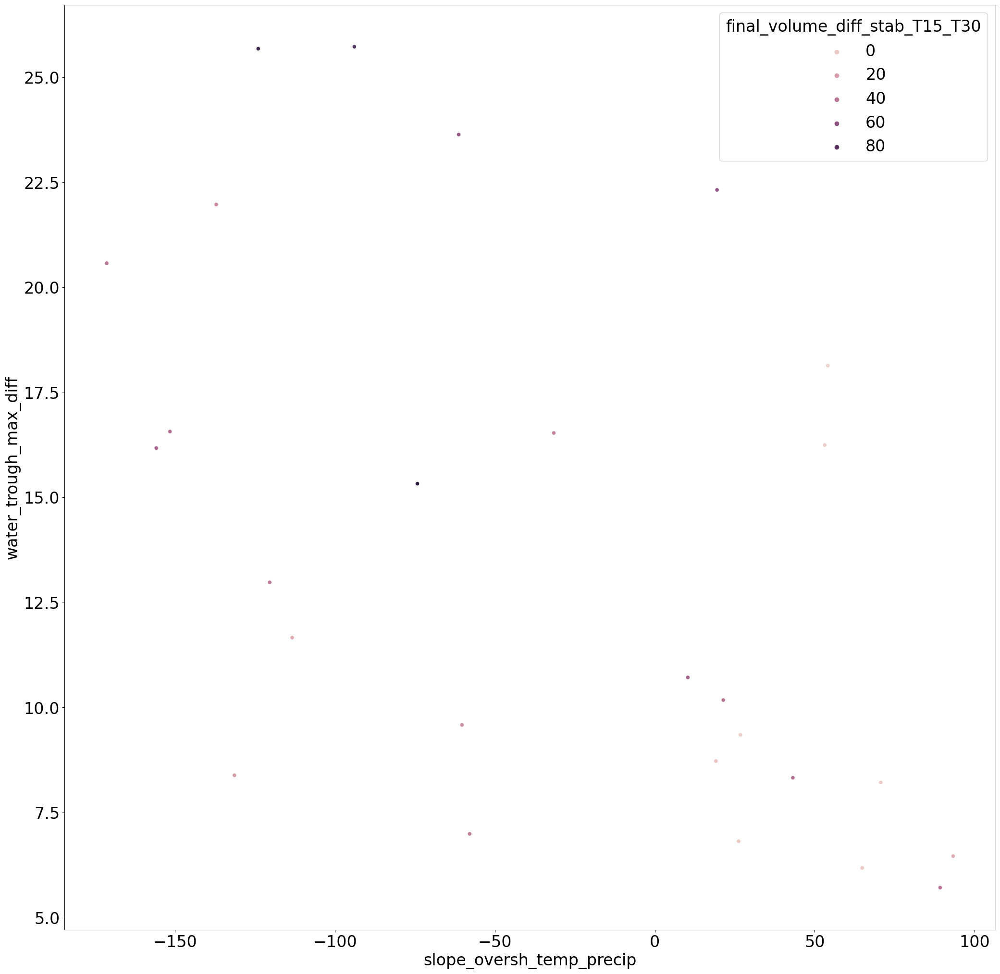

In [447]:
plt.figure(figsize=(25,25))

sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_trough& condi_slope_clear).dropna(),
                y='water_trough_max_diff',
                x='slope_oversh_temp_precip',
                color='red', hue= 'final_volume_diff_stab_T15_T30') #, label=f'{n} basins  with >1% avg. precipitation decrease\nin period 2050-2350 for Overshoot 3.0°C->1.5°C\ncompared to 1.5°C stabilisation scenario') 

In [404]:
condi_prcp_increase = water_trough_stats_basins['mean_precip_change_perc_oversh_vs_stab_bef2350'] > 1  # 3% increase on average between 2050 and 2350
condi_prcp_decrease = water_trough_stats_basins['mean_precip_change_perc_oversh_vs_stab_bef2350'] < -1

len(water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_increase).dropna())

21

In [357]:
len(water_trough_stats_basins_sel.where(condi_vol_diff &  condi_prcp_decrease).dropna())

17

In [358]:
len(water_trough_stats_basins_sel.water_trough_max_diff.dropna())

41

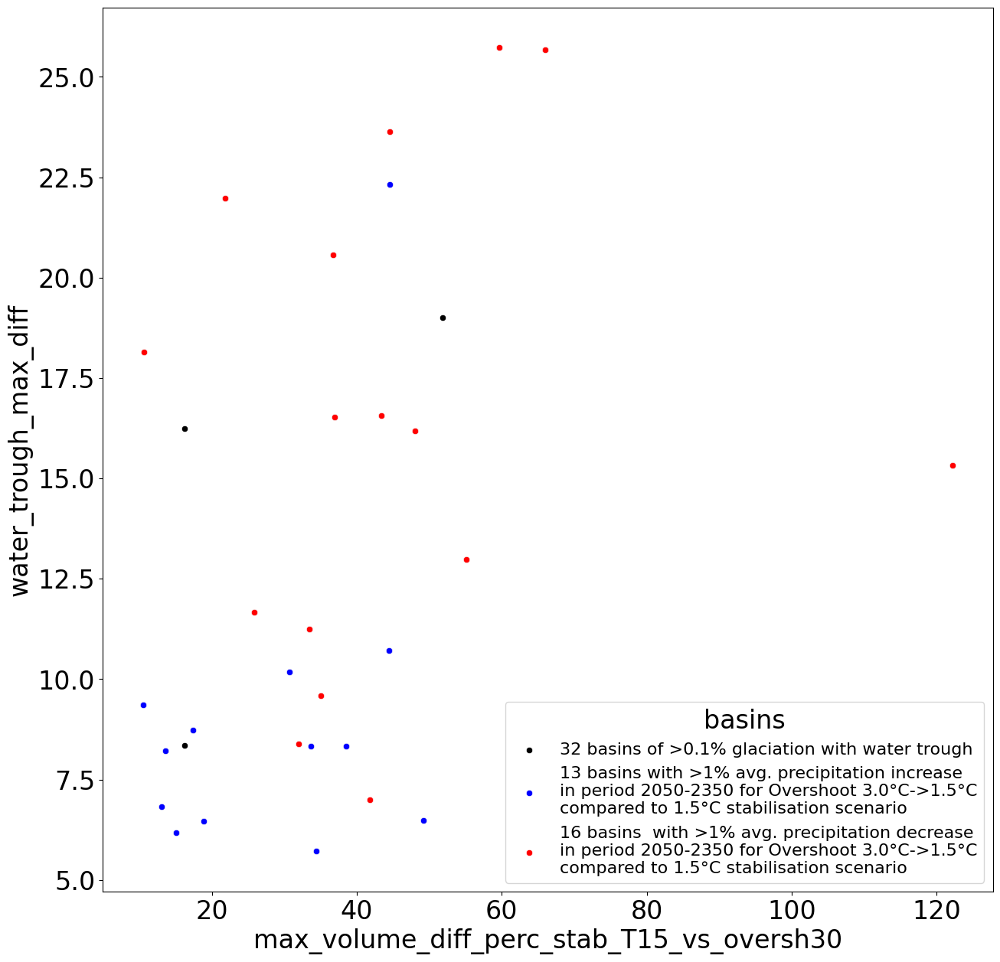

In [359]:
plt.figure(figsize=(15,15))
n=len(water_trough_stats_basins_sel.where(condi_trough).dropna())
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_trough).dropna(),
                y='water_trough_max_diff',
                x='max_volume_diff_perc_stab_T15_vs_oversh30', color='black', label=f'{n} basins of >0.1% glaciation with water trough') #, hue='mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350') #, ax=ax)

n=len(water_trough_stats_basins_sel.where(condi_trough & condi_prcp_increase).dropna())
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_trough & condi_prcp_increase).dropna(),
                y='water_trough_max_diff',
                x='max_volume_diff_perc_stab_T15_vs_oversh30', color='blue', label=f'{n} basins with >1% avg. precipitation increase\nin period 2050-2350 for Overshoot 3.0°C->1.5°C\ncompared to 1.5°C stabilisation scenario')  #, hue='mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350') #, ax=ax)

n=len(water_trough_stats_basins_sel.where(condi_trough & condi_prcp_decrease).dropna())
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_trough & condi_prcp_decrease).dropna(),
                y='water_trough_max_diff',
                x='max_volume_diff_perc_stab_T15_vs_oversh30',
                color='red', label=f'{n} basins  with >1% avg. precipitation decrease\nin period 2050-2350 for Overshoot 3.0°C->1.5°C\ncompared to 1.5°C stabilisation scenario') 
#, hue='mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350') #, ax=ax

plt.legend(title='basins', fontsize=16)

In [351]:
water_trough_stats_basins_sel.where(condi_trough & condi_prcp_decrease).dropna().water_trough_max_diff.median() / water_trough_stats_basins_sel.where(condi_trough & condi_prcp_increase).dropna().water_trough_max_diff.median()

1.9769772292436294

<AxesSubplot:xlabel='peak_temp_diff_oversh_vs_stab_bef2350', ylabel='max_volume_diff_perc_stab_T15_vs_oversh30'>

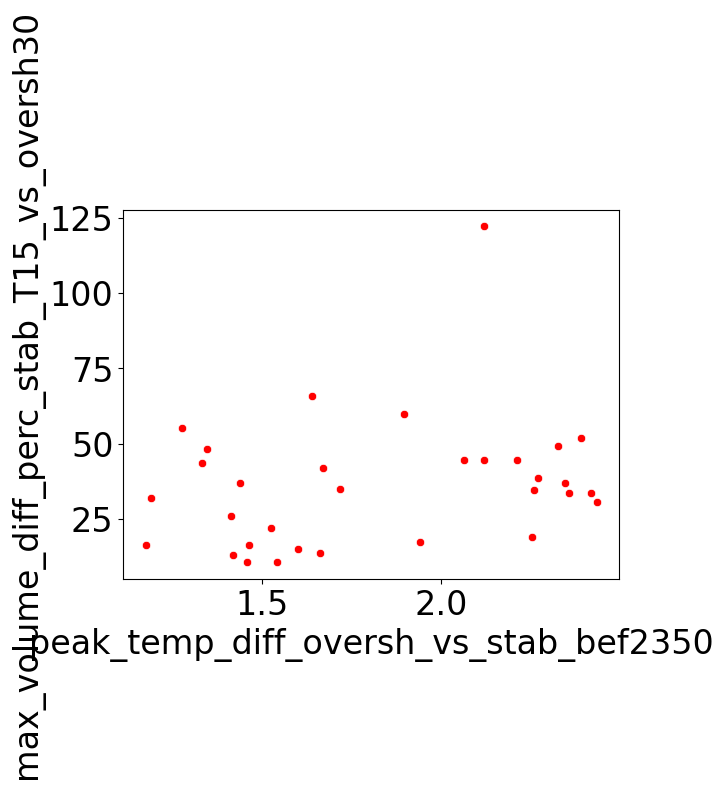

In [364]:
# no relation ... 
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_trough).dropna(),
                y='max_volume_diff_perc_stab_T15_vs_oversh30',
                x='peak_temp_diff_oversh_vs_stab_bef2350',
                color='red') #, label=f'{n} basins  with >1% avg. precipitation decrease\nin period 2050-2350 for Overshoot 3.0°C->1.5°C\ncompared to 1.5°C stabilisation scenario') 

In [366]:
#water_trough_stats_basins_sel

<AxesSubplot:xlabel='mean_precip_change_perc_oversh_vs_stab_bef2350', ylabel='water_trough_max_diff'>

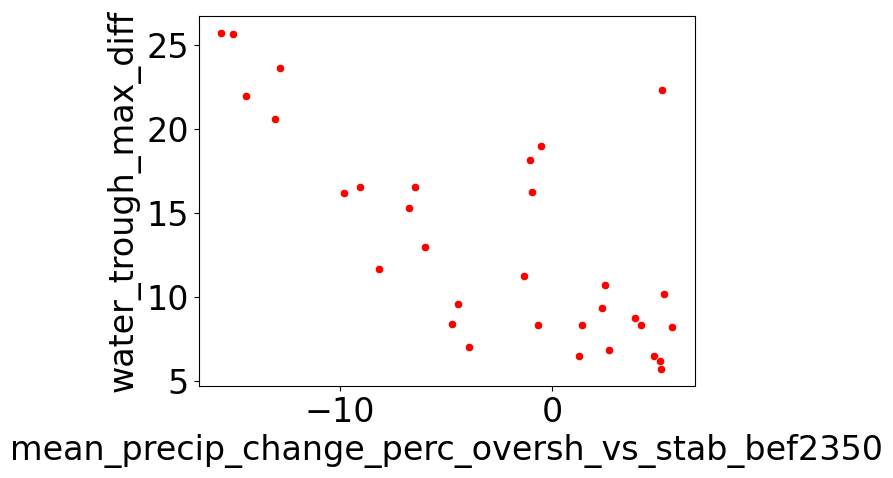

In [361]:
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_trough).dropna(),
                y='water_trough_max_diff',
                x='mean_precip_change_perc_oversh_vs_stab_bef2350',
                color='red') #, label=f'{n} basins  with >1% avg. precipitation decrease\nin period 2050-2350 for Overshoot 3.0°C->1.5°C\ncompared to 1.5°C stabilisation scenario') 

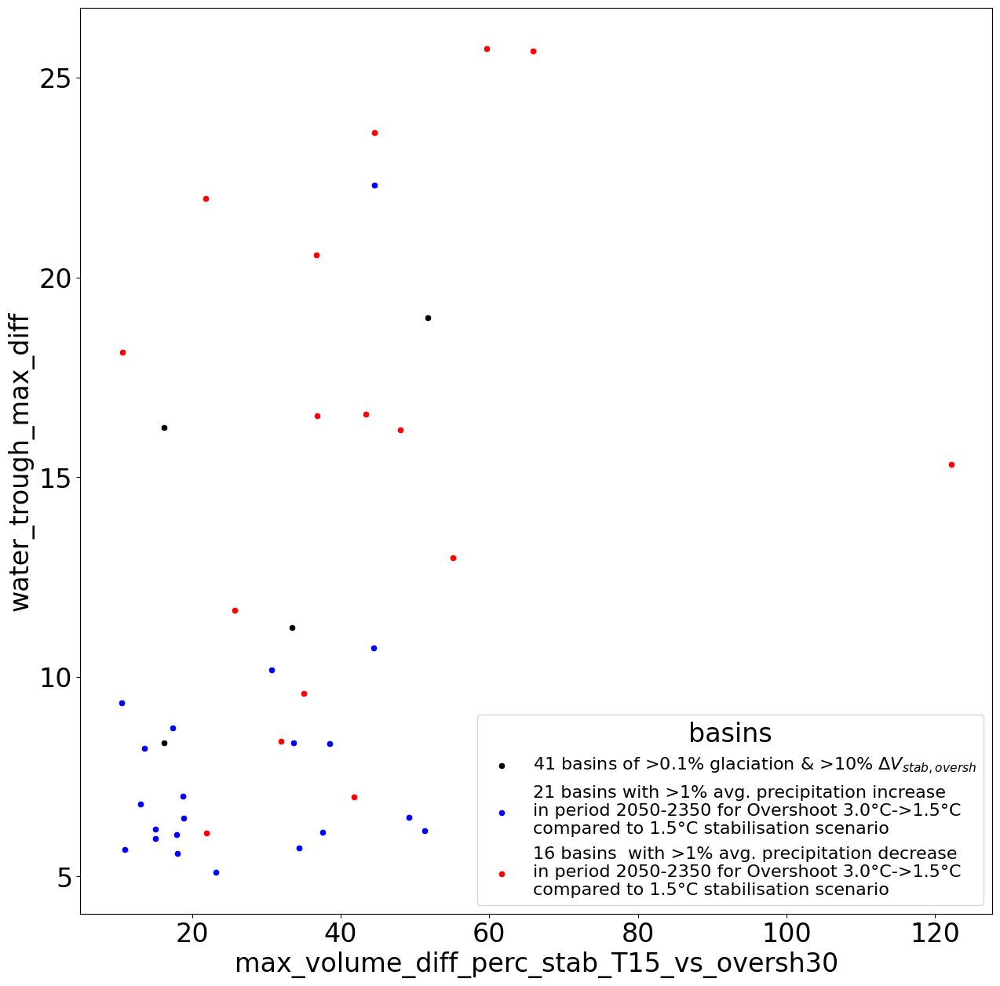

In [271]:
plt.figure(figsize=(15,15))
n=len(water_trough_stats_basins_sel.where(condi_vol_diff).dropna())
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_vol_diff).dropna(),
                y='water_trough_max_diff',
                x='max_volume_diff_perc_stab_T15_vs_oversh30', color='black', label=f'{n} basins of >0.1% glaciation & >10%'+r' $\Delta V_{stab,oversh}$') #, hue='mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350') #, ax=ax)

n=len(water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_increase).dropna())
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_increase).dropna(),
                y='water_trough_max_diff',
                x='max_volume_diff_perc_stab_T15_vs_oversh30', color='blue', label=f'{n} basins with >1% avg. precipitation increase\nin period 2050-2350 for Overshoot 3.0°C->1.5°C\ncompared to 1.5°C stabilisation scenario')  #, hue='mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350') #, ax=ax)

n=len(water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_decrease).dropna())
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_decrease).dropna(),
                y='water_trough_max_diff',
                x='max_volume_diff_perc_stab_T15_vs_oversh30',
                color='red', label=f'{n} basins  with >1% avg. precipitation decrease\nin period 2050-2350 for Overshoot 3.0°C->1.5°C\ncompared to 1.5°C stabilisation scenario') 
#, hue='mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350') #, ax=ax

plt.legend(title='basins', fontsize=16)

In [272]:
water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_increase).dropna().water_trough_max_diff.median()

6.480796813964844

In [273]:
water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_decrease).dropna().water_trough_max_diff.median()

16.354097366333008

In [274]:
water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_decrease).dropna().water_trough_max_diff.median() / water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_increase).dropna().water_trough_max_diff.median()

2.523470158961494

**The water trough is around 2.5 times larger for basins where precipitation decreases for warmer temperatures** 

In [230]:
water_trough_stats_basins_sel['cumulative_runoff_diff_trough'] = water_trough_stats_basins_sel.cumulative_runoff_diff_trough.astype(float)
water_trough_stats_basins_sel['yrs_with_water_trough'] = water_trough_stats_basins_sel.yrs_with_water_trough.astype(float)

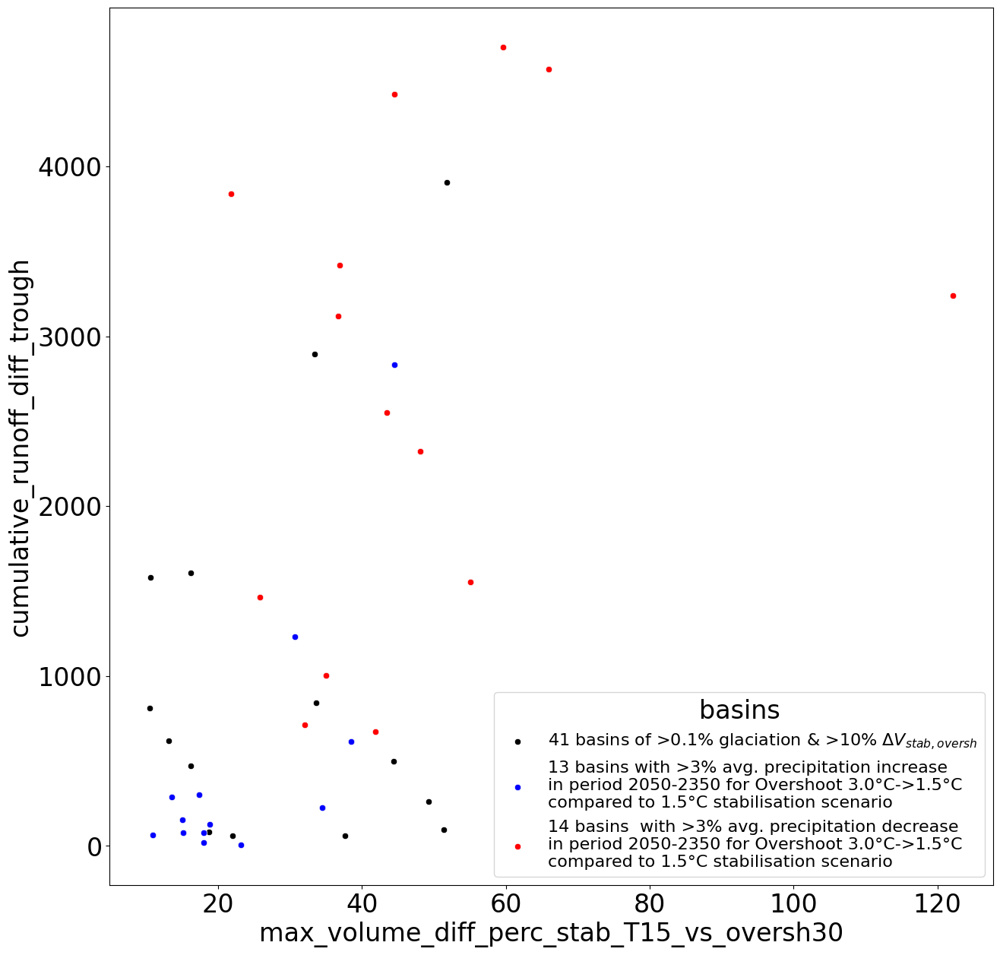

In [226]:
plt.figure(figsize=(15,15))
n=len(water_trough_stats_basins_sel.where(condi_vol_diff).dropna())
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_vol_diff).dropna(),
                y='cumulative_runoff_diff_trough',
                x='max_volume_diff_perc_stab_T15_vs_oversh30', color='black', label=f'{n} basins of >0.1% glaciation & >10%'+r' $\Delta V_{stab,oversh}$') #, hue='mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350') #, ax=ax)

n=len(water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_increase).dropna())
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_increase).dropna(),
                y='cumulative_runoff_diff_trough',
                x='max_volume_diff_perc_stab_T15_vs_oversh30', color='blue', label=f'{n} basins with >3% avg. precipitation increase\nin period 2050-2350 for Overshoot 3.0°C->1.5°C\ncompared to 1.5°C stabilisation scenario')  #, hue='mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350') #, ax=ax)

n=len(water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_decrease).dropna())
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_decrease).dropna(),
                y='cumulative_runoff_diff_trough',
                x='max_volume_diff_perc_stab_T15_vs_oversh30',
                color='red', label=f'{n} basins  with >3% avg. precipitation decrease\nin period 2050-2350 for Overshoot 3.0°C->1.5°C\ncompared to 1.5°C stabilisation scenario') 
#, hue='mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350') #, ax=ax

plt.legend(title='basins', fontsize=16)

In [227]:
water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_decrease).dropna().cumulative_runoff_diff_trough.median() / water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_increase).dropna().cumulative_runoff_diff_trough.median()

18.38683691403957

In [166]:
water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_decrease).dropna()

,yrs_with_water_trough,cumulative_runoff_diff_trough,water_trough_min_year,water_trough_max_diff,water_trough_start_end,peak_temp_diff_oversh_vs_stab_bef2350,yr_peak_temp_diff_oversh_vs_stab_bef2350,cumsum_temp_diff_oversh_stab_bef2350,cumsum_temp_diff_oversh_stab_aft2350,mean_precip_change_perc_oversh_vs_stab_bef2350,mean_precip_change_perc_oversh_vs_stab_aft2350,max_volume_diff_perc_stab_T15_vs_oversh30,yr_with_max_volume_diff_stab_T15_vs_oversh30,final_volume_diff_stab_T15_T30,basin_name,regional_warming_aft2350,mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350
3209,194,1464.4409,2208,11.663727,2103.0_2296.0,1.412949,2178.0,224.918547,5.009656,-7.118473,1.603344,25.798849,2177.0,13.070430,CHICO,0.567756,-4.439767
3212,295,4427.032,2173,23.636547,2087.0_2457.0,2.063244,2171.0,318.259845,11.968445,-12.590388,0.606532,44.552452,2178.0,55.638535,COLORADO,0.316435,-20.757981
3405,302,4574.1733,2174,25.678833,2077.0_2457.0,1.638638,2171.0,260.594433,18.726630,-13.702734,0.599683,65.934631,2285.0,93.128883,BIOBIO,0.367808,-22.849952
3408,191,1551.7056,2193,12.978455,2098.0_2295.0,1.275042,2178.0,205.365761,2.064581,-5.268447,2.154311,55.086338,2166.0,37.772625,CISNES,0.507151,-2.445537
3409,365,3417.8303,2185,16.533489,2099.0_2463.0,2.347154,2173.0,362.093366,-1.156826,-7.282099,4.564056,36.897240,2155.0,33.946598,COPIAPO,0.386136,-1.595532
3419,236,2549.2412,2193,16.568794,2071.0_2306.0,1.332042,2143.0,220.339492,6.210392,-8.311497,2.465719,43.419678,2156.0,43.874416,PALENA (also CORCOVADO),0.449496,-3.370821
3422,237,3120.4216,2174,20.573715,2075.0_2311.0,1.438635,2171.0,239.972914,13.600243,-12.083189,2.174788,36.730953,2156.0,41.052319,PUELO,0.377590,-5.556030
3423,298,4701.5776,2173,25.726288,2081.0_2458.0,1.897436,2171.0,300.581765,18.651938,-14.891399,-0.111305,59.652992,2300.0,84.155975,RAPEL,0.323204,133.789445
3428,274,3841.2285,2174,21.972256,2071.0_2430.0,1.525606,2171.0,254.183868,17.474948,-13.135399,0.966567,21.848066,2178.0,30.790447,VALDIVIA,0.515919,-13.589745
3429,222,2323.8857,2193,16.174706,2085.0_2306.0,1.344899,2143.0,224.582591,7.431884,-9.001758,2.437991,48.049660,2166.0,48.861160,YELCHO,0.436253,-3.692285


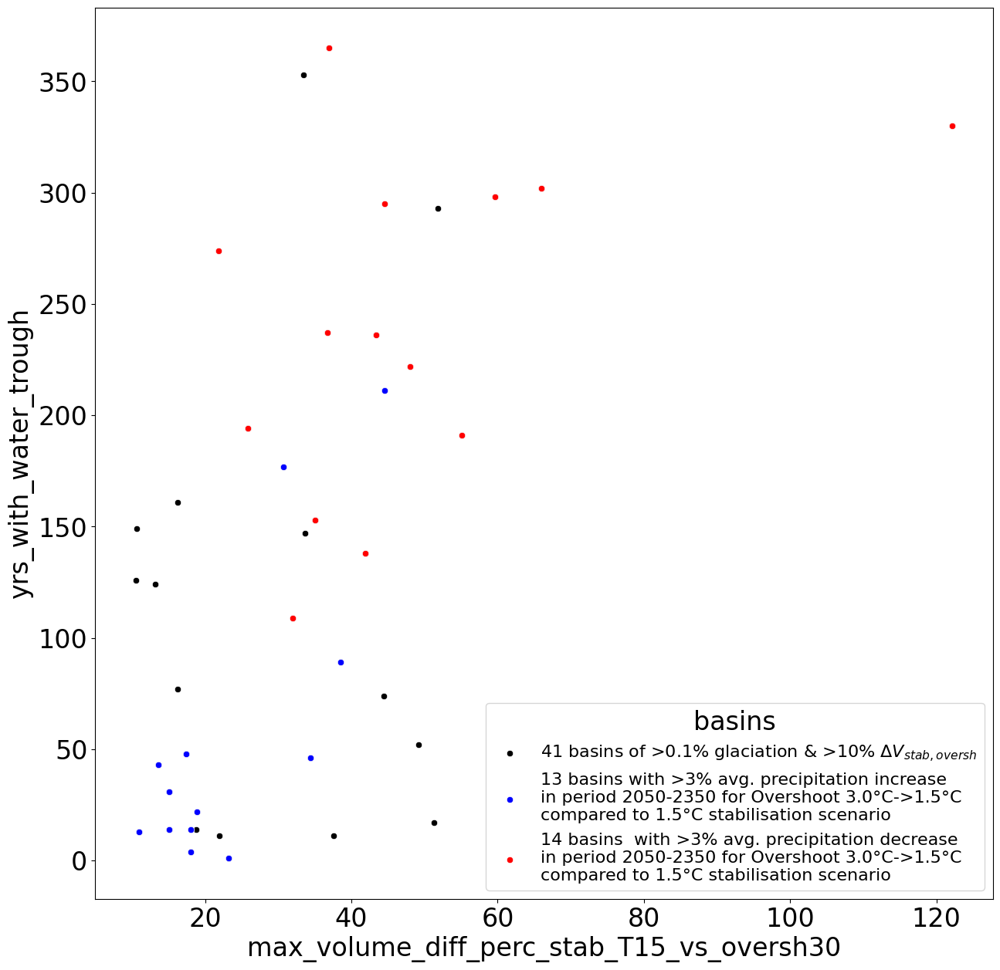

In [231]:
plt.figure(figsize=(15,15))
n=len(water_trough_stats_basins_sel.where(condi_vol_diff).dropna())
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_vol_diff).dropna(),
                y='yrs_with_water_trough',
                x='max_volume_diff_perc_stab_T15_vs_oversh30', color='black', label=f'{n} basins of >0.1% glaciation & >10%'+r' $\Delta V_{stab,oversh}$') #, hue='mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350') #, ax=ax)

n=len(water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_increase).dropna())
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_increase).dropna(),
                y='yrs_with_water_trough',
                x='max_volume_diff_perc_stab_T15_vs_oversh30', color='blue', label=f'{n} basins with >3% avg. precipitation increase\nin period 2050-2350 for Overshoot 3.0°C->1.5°C\ncompared to 1.5°C stabilisation scenario')  #, hue='mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350') #, ax=ax)

n=len(water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_decrease).dropna())
sns.scatterplot(data = water_trough_stats_basins_sel.where(condi_vol_diff & condi_prcp_decrease).dropna(),
                y='yrs_with_water_trough',
                x='max_volume_diff_perc_stab_T15_vs_oversh30',
                color='red', label=f'{n} basins  with >3% avg. precipitation decrease\nin period 2050-2350 for Overshoot 3.0°C->1.5°C\ncompared to 1.5°C stabilisation scenario') 
#, hue='mean_precip_change_perc_oversh_vs_stab_bef_vs_aft2350') #, ax=ax

plt.legend(title='basins', fontsize=16)

<AxesSubplot:>

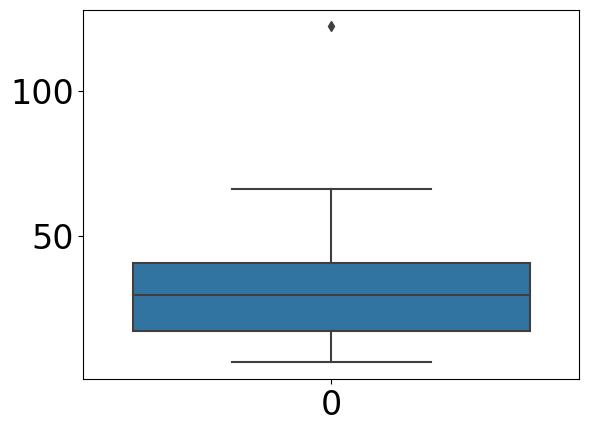

In [141]:
sns.boxplot(water_trough_stats_basins_sel['max_volume_diff_perc_stab_T15_vs_oversh30'])

41


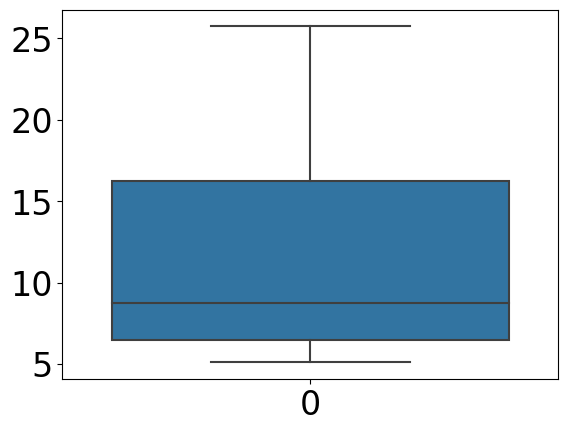

In [117]:
sns.boxplot(water_trough_stats_basins_sel['water_trough_max_diff'].dropna())
print(len(water_trough_stats_basins_sel['water_trough_max_diff'].dropna()))

In [105]:
water_trough_stats_basins_sel.loc[water_trough_stats_basins_sel['water_trough_max_diff'].dropna().index]['yrs_with_water_trough'].astype(int) >=50

2302    False
2306     True
2309     True
2902     True
2909     True
2910     True
2913    False
2914     True
3209     True
3212     True
3401     True
3403    False
3404    False
3405     True
3408     True
3409     True
3416     True
3418     True
3419     True
3420     True
3422     True
3423     True
3428     True
3429     True
4401    False
4416    False
4427    False
4428    False
4431    False
4435    False
5406    False
6101     True
6104     True
6110    False
6209    False
6213    False
6223     True
6237     True
6241     True
6243     True
6254     True
Name: yrs_with_water_trough, dtype: bool

In [ ]:
sns.boxplot(water_trough_stats_basins_sel['water_trough_max_diff'].dropna())


In [99]:
water_trough_stats_basins_sel['water_trough_max_diff'].dropna().min()

5.100807189941406

In [50]:

# 60 glaciers left ...
# only basins where we see differences in the temperature scenarios
water_trough_stats_basins_sel = water_trough_stats_basins_sel.loc[water_trough_stats_basins.final_volume_diff_stab_T15_T30>5].dropna()
print(len(water_trough_stats_basins_sel))
                                              

60
34


In [88]:
df_runoff_rel_sel = df_runoff_rel.sel(scenario=['stab_T20','stab_T25','stab_T30'])
for y in np.arange(2025,2480,20):
    t = df_runoff_rel_sel.where(df_runoff_rel_sel.sel(time=y).max(dim='scenario') <= 100).dropna(dim='basin')
    tnon = df_runoff_rel_sel.where(df_runoff_rel_sel.sel(time=y).max(dim='scenario') > 100).dropna(dim='basin')

    print(y, len(t.basin), tnon.basin.values)
    if y > 2200:
        print(water_trough_stats_basins.loc[tnon.basin.values].basin_name.values)

2025 71 ['2433' '2902' '3404' '5406']
2045 37 ['4125' '4401' '4406' '4408' '4410' '4414' '4416' '4426' '4427' '4428'
 '4430' '4431' '4435' '6101' '6104' '6110' '6209' '6213' '6219' '6227'
 '6254' '2413' '2108' '2302' '2306' '2309' '2433' '2902' '2905' '2910'
 '2914' '3227' '3425' '3212' '3403' '3409' '3412' '5406']
2065 57 ['4401' '4408' '4428' '4430' '4435' '6104' '6110' '6254' '2413' '2306'
 '2309' '2902' '2914' '3227' '3403' '3412' '3420' '5406']
2085 64 ['4401' '4408' '4430' '4435' '6110' '2413' '2914' '3227' '3403' '3420'
 '5406']
2105 65 ['4401' '4408' '4430' '4435' '6110' '2413' '2914' '3227' '3403' '3420']
2125 66 ['4401' '4408' '4430' '4431' '4435' '2914' '3227' '3403' '3420']
2145 67 ['4401' '4408' '4430' '4435' '2914' '3227' '3403' '3420']
2165 69 ['4401' '4408' '4430' '4435' '3227' '3403']
2185 70 ['4401' '4408' '4435' '3227' '3403']
2205 67 ['4401' '4408' '4435' '6101' '6104' '6110' '3227' '3403']
['ALSEK' 'COPPER' 'YUKON' 'JOKULSA A FJOLLUM' 'LAGARFLJOT' 'SVARTA'
 'MAGDAL

In [90]:
df_melt_off_on_rel_sel = df_melt_off_on_rel.sel(scenario=['stab_T15','stab_T20','stab_T25','stab_T30'])
for y in np.arange(2025,2480,20):
    t = df_melt_off_on_rel_sel.where(df_melt_off_on_rel_sel.sel(time=y).max(dim='scenario') <= 100).dropna(dim='basin')
    tnon = df_melt_off_on_rel_sel.where(df_melt_off_on_rel_sel.sel(time=y).max(dim='scenario') > 100).dropna(dim='basin')

    print(y, len(t.basin), tnon.basin.values, )
    print(water_trough_stats_basins.loc[tnon.basin.values].basin_name.values)

2025 74 ['6110']
['SVARTA']
2045 52 ['4401' '4406' '4408' '4428' '4430' '4435' '6101' '6104' '6110' '6209'
 '6213' '6219' '6227' '6254' '2413' '2108' '2309' '2902' '2914' '3212'
 '3403' '3409' '3412']
['ALSEK' 'COLUMBIA' 'COPPER' 'STIKINE' 'SUSITNA' 'YUKON'
 'JOKULSA A FJOLLUM' 'LAGARFLJOT' 'SVARTA' 'DRAMSELVA' 'GLOMAA'
 'KALIXALVEN' 'LULEALVEN' 'THJORSA' 'KAMCHATKA' 'OB' 'INDUS' 'ARAL SEA'
 'TARIM' 'COLORADO' 'AZOPARDO' 'COPIAPO' 'HUASCO']
2065 64 ['4401' '4408' '4430' '4435' '6104' '6110' '6254' '2413' '2914' '3403'
 '3412']
['ALSEK' 'COPPER' 'SUSITNA' 'YUKON' 'LAGARFLJOT' 'SVARTA' 'THJORSA'
 'KAMCHATKA' 'TARIM' 'AZOPARDO' 'HUASCO']
2085 68 ['4401' '4408' '4430' '4435' '6110' '2914' '3403']
['ALSEK' 'COPPER' 'SUSITNA' 'YUKON' 'SVARTA' 'TARIM' 'AZOPARDO']
2105 70 ['4401' '4408' '4430' '4435' '2914']
['ALSEK' 'COPPER' 'SUSITNA' 'YUKON' 'TARIM']
2125 73 ['4408' '4435']
['COPPER' 'YUKON']
2145 73 ['4408' '4435']
['COPPER' 'YUKON']
2165 73 ['4408' '4435']
['COPPER' 'YUKON']
2185 74 ['6101

In [60]:
df_melt_off_on_rel_sel = df_melt_off_on_rel.drop_sel(scenario='stab_T12')
for y in np.arange(2025,2480,20):
    t = df_melt_off_on_rel_sel.where(df_melt_off_on_rel_sel.sel(time=y).max(dim='scenario') <= 100).dropna(dim='basin')
    tnon = df_melt_off_on_rel_sel.where(df_melt_off_on_rel_sel.sel(time=y).max(dim='scenario') > 100).dropna(dim='basin')

    print(y, len(t.basin), tnon.basin.values)
    if y > 2200:
        print(water_trough_stats_basins.loc[tnon.basin.values].basin_name.values)

2025 73 ['6110' '2902']
2045 52 ['4401' '4406' '4408' '4428' '4430' '4435' '6101' '6104' '6110' '6209'
 '6213' '6219' '6227' '6254' '2413' '2108' '2309' '2902' '2914' '3212'
 '3403' '3409' '3412']
2065 64 ['4401' '4408' '4430' '4435' '6104' '6110' '6254' '2413' '2914' '3403'
 '3412']
2085 68 ['4401' '4408' '4430' '4435' '6110' '2914' '3403']
2105 70 ['4401' '4408' '4430' '4435' '2914']
2125 73 ['4408' '4435']
2145 73 ['4408' '4435']
2165 73 ['4408' '4435']
2185 74 ['6101']
2205 75 []
[]
2225 74 ['6101']
['JOKULSA A FJOLLUM']
2245 75 []
[]
2265 75 []
[]
2285 75 []
[]
2305 75 []
[]
2325 74 ['6223']
['KUBAN']
2345 74 ['6223']
['KUBAN']
2365 74 ['6223']
['KUBAN']
2385 75 []
[]
2405 74 ['3232']
['NEGRO (Atlantic Ocean)']
2425 72 ['6223' '3232' '3405']
['KUBAN' 'NEGRO (Atlantic Ocean)' 'BIOBIO']
2445 74 ['6223']
['KUBAN']
2465 74 ['6223']
['KUBAN']


In [293]:
water_trough_stats_basins.loc[water_trough_stats_basins['max_volume_diff_perc_stab_T15_vs_oversh30']>50]

,yrs_with_water_trough,cumulative_runoff_diff_trough,water_trough_min_year,water_trough_max_diff,water_trough_start_end,peak_temp_diff_oversh_vs_stab_bef2350,yr_peak_temp_diff_oversh_vs_stab_bef2350,cumsum_temp_diff_oversh_stab_bef2350,cumsum_temp_diff_oversh_stab_aft2350,mean_precip_change_perc_oversh_vs_stab_bef2350,mean_precip_change_perc_oversh_vs_stab_aft2350,max_volume_diff_perc_stab_T15_vs_oversh30,yr_with_max_volume_diff_stab_T15_vs_oversh30,final_volume_diff_stab_T15_T30,basin_name
6223,330,3241.8457,2171,15.326813,2110.0_2440.0,2.119093,2168.0,299.847849,0.909798,-6.376446,-0.743856,122.140999,2157.0,98.385727,KUBAN
2902,293,3904.2534,2322,19.000633,2182.0_2474.0,2.389387,2158.0,339.130773,8.714569,0.407523,-2.539464,51.783379,2214.0,74.979805,ARAL SEA
3227,90.0,296.363342,NaN,NaN,NaN,1.907332,2180.0,278.796083,-11.569546,0.454599,-0.938512,76.577713,2224.0,81.663742,MAGDALENA
3425,NaN,NaN,NaN,NaN,NaN,2.199201,2180.0,312.211826,-25.579590,5.295378,1.473310,53.553417,2185.0,61.560760,SANTA
3232,304,4962.279,2174,26.577209,2077.0_2454.0,1.619332,2171.0,259.978330,18.434467,-13.558532,0.688460,62.023376,2178.0,86.826294,NEGRO (Atlantic Ocean)
3405,302,4574.1733,2174,25.678833,2077.0_2457.0,1.638638,2171.0,260.594433,18.726630,-13.702734,0.599683,65.934631,2285.0,93.128883,BIOBIO
3408,191,1551.7056,2193,12.978455,2098.0_2295.0,1.275042,2178.0,205.365761,2.064581,-5.268447,2.154311,55.086338,2166.0,37.772625,CISNES
3423,298,4701.5776,2173,25.726288,2081.0_2458.0,1.897436,2171.0,300.581765,18.651938,-14.891399,-0.111305,59.652992,2300.0,84.155975,RAPEL
5406,17,95.89895,2342,6.145584,2332.0_2348.0,1.529353,2164.0,230.867325,-9.461777,2.117205,0.948581,51.330902,2195.0,48.868553,CLUTHA


<AxesSubplot:xlabel='max_volume_diff_perc_stab_T15_vs_oversh30', ylabel='water_trough_max_diff'>

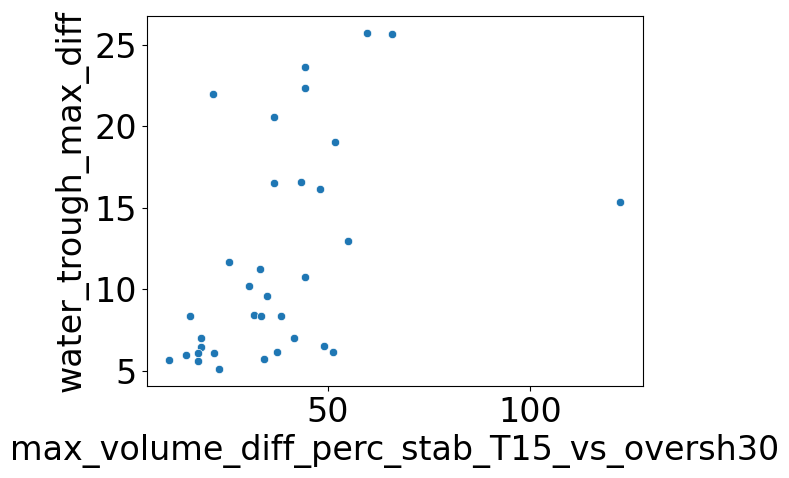

In [294]:
sns.scatterplot(data=water_trough_stats_basins_sel,
                x='max_volume_diff_perc_stab_T15_vs_oversh30',
                y='water_trough_max_diff')

In [ ]:
sns.scatterplot(data=water_trough_stats_basins.where(water_trough_stats_basins['cumsum_temp_diff_oversh_stab_bef2350'] / water_trough_stats_basins['cumsum_temp_diff_oversh_stab_aft2350'] > 2).dropna(),
                x='max_volume_diff_perc_stab_T15_vs_oversh30',
                y='water_trough_max_diff')

<AxesSubplot:xlabel='max_volume_diff_perc_stab_T15_vs_oversh30', ylabel='water_trough_max_diff'>

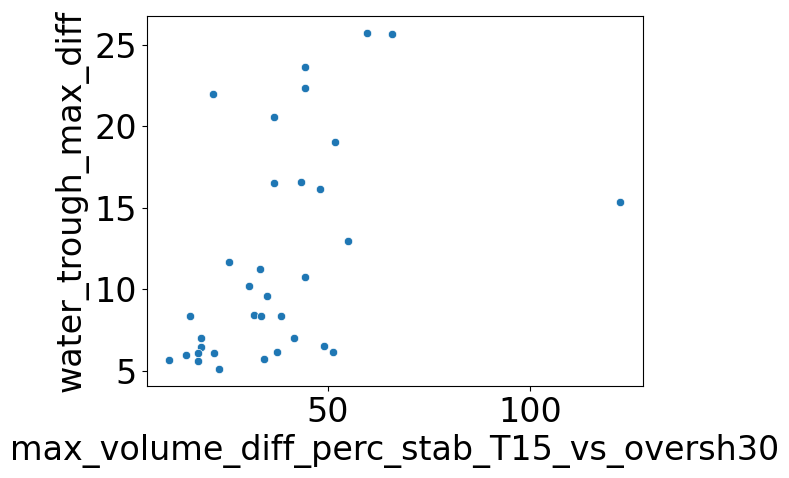

In [295]:
sns.scatterplot(data=water_trough_stats_basins_sel,
                x='max_volume_diff_perc_stab_T15_vs_oversh30',
                y='water_trough_max_diff')

In [297]:
water_trough_stats_basins_sel.columns

Index(['yrs_with_water_trough', 'cumulative_runoff_diff_trough',
       'water_trough_min_year', 'water_trough_max_diff',
       'water_trough_start_end', 'peak_temp_diff_oversh_vs_stab_bef2350',
       'yr_peak_temp_diff_oversh_vs_stab_bef2350',
       'cumsum_temp_diff_oversh_stab_bef2350',
       'cumsum_temp_diff_oversh_stab_aft2350',
       'mean_precip_change_perc_oversh_vs_stab_bef2350',
       'mean_precip_change_perc_oversh_vs_stab_aft2350',
       'max_volume_diff_perc_stab_T15_vs_oversh30',
       'yr_with_max_volume_diff_stab_T15_vs_oversh30',
       'final_volume_diff_stab_T15_T30', 'basin_name'],
      dtype='object')

<AxesSubplot:xlabel='peak_temp_diff_oversh_vs_stab_bef2350', ylabel='mean_precip_change_perc_oversh_vs_stab_bef2350'>

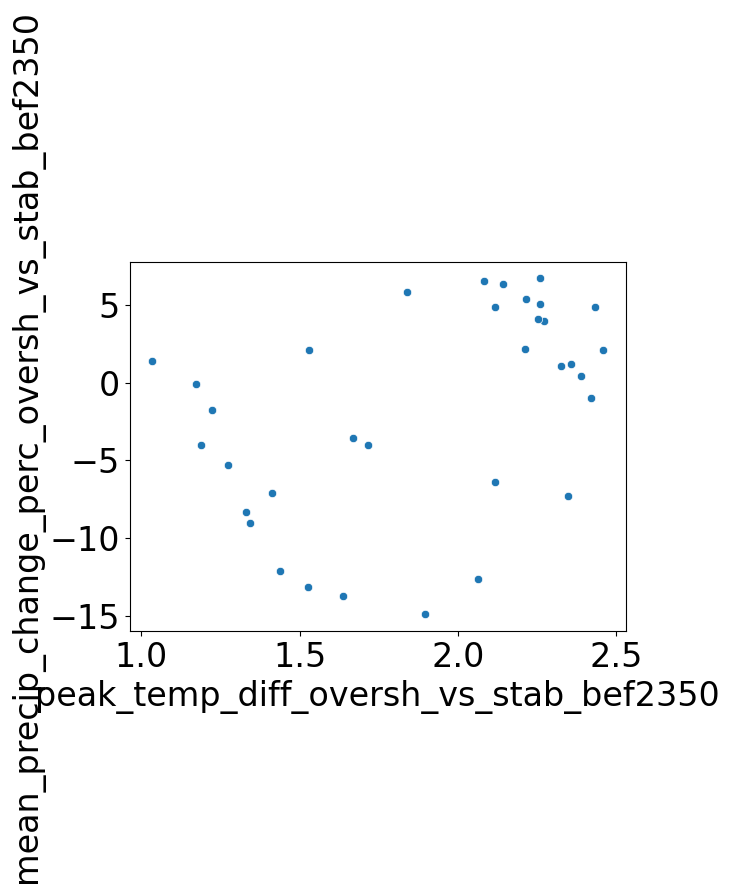

In [298]:
sns.scatterplot(data=water_trough_stats_basins_sel,
                x='peak_temp_diff_oversh_vs_stab_bef2350',
                y='mean_precip_change_perc_oversh_vs_stab_bef2350')

<AxesSubplot:xlabel='peak_temp_diff_oversh_vs_stab_bef2350', ylabel='max_volume_diff_perc_stab_T15_vs_oversh30'>

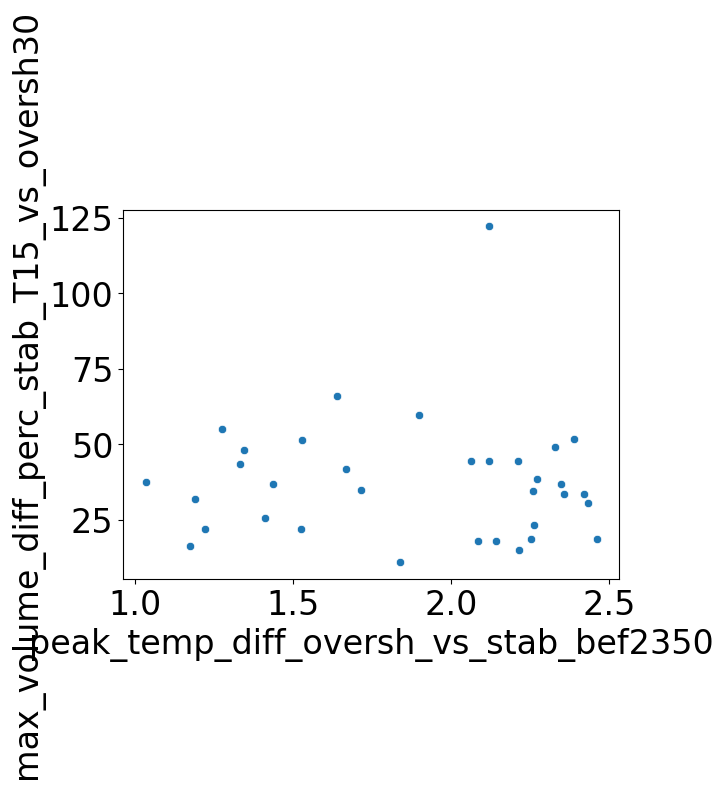

In [296]:
sns.scatterplot(data=water_trough_stats_basins_sel,
                x='peak_temp_diff_oversh_vs_stab_bef2350',
                y='max_volume_diff_perc_stab_T15_vs_oversh30')

<AxesSubplot:xlabel='peak_temp_diff_oversh_vs_stab_bef2350', ylabel='max_volume_diff_perc_stab_T15_vs_oversh30'>

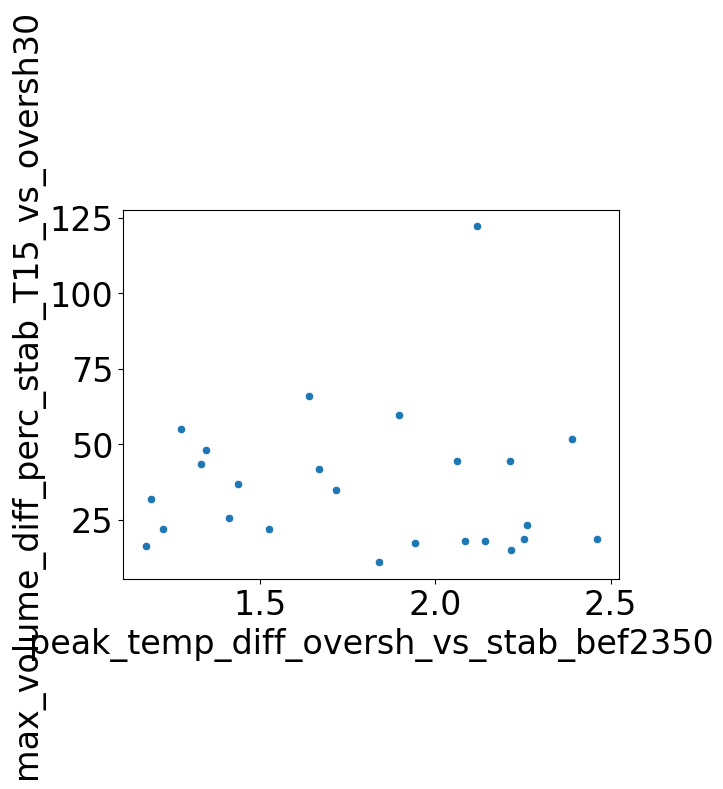

In [262]:
sns.scatterplot(data=water_trough_stats_basins.where(water_trough_stats_basins['cumsum_temp_diff_oversh_stab_bef2350'] / water_trough_stats_basins['cumsum_temp_diff_oversh_stab_aft2350'] > 2).dropna(),
                x='peak_temp_diff_oversh_vs_stab_bef2350',
                y='max_volume_diff_perc_stab_T15_vs_oversh30')

<AxesSubplot:xlabel='peak_temp_diff_oversh_vs_stab_bef2350'>

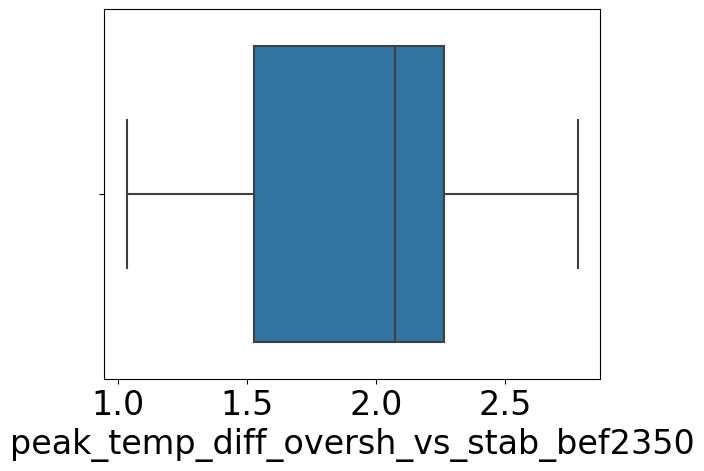

In [264]:
sns.boxplot(data= water_trough_stats_basins, x='peak_temp_diff_oversh_vs_stab_bef2350')

{'whiskers': [<matplotlib.lines.Line2D at 0x7fcf31edda50>,
 'caps': [<matplotlib.lines.Line2D at 0x7fcf31eddff0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fcf31edd780>],
 'medians': [<matplotlib.lines.Line2D at 0x7fcf31ede590>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fcf31ede860>],
 'means': []}

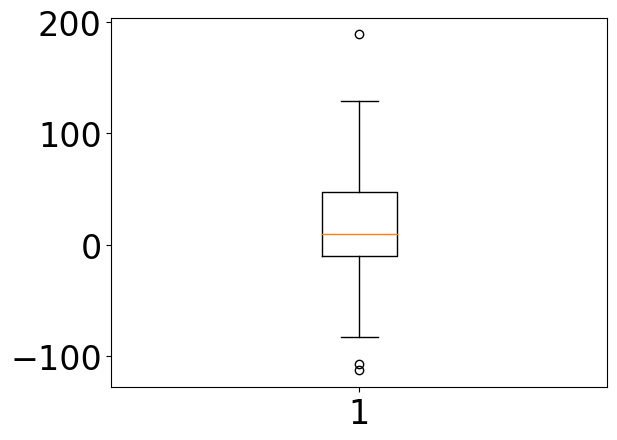

In [270]:
plt.boxplot(water_trough_stats_basins['yr_with_max_volume_diff_stab_T15_vs_oversh30'] - water_trough_stats_basins['yr_peak_temp_diff_oversh_vs_stab_bef2350'])

<AxesSubplot:xlabel='yr_peak_temp_diff_oversh_vs_stab_bef2350', ylabel='yr_with_max_volume_diff_stab_T15_vs_oversh30'>

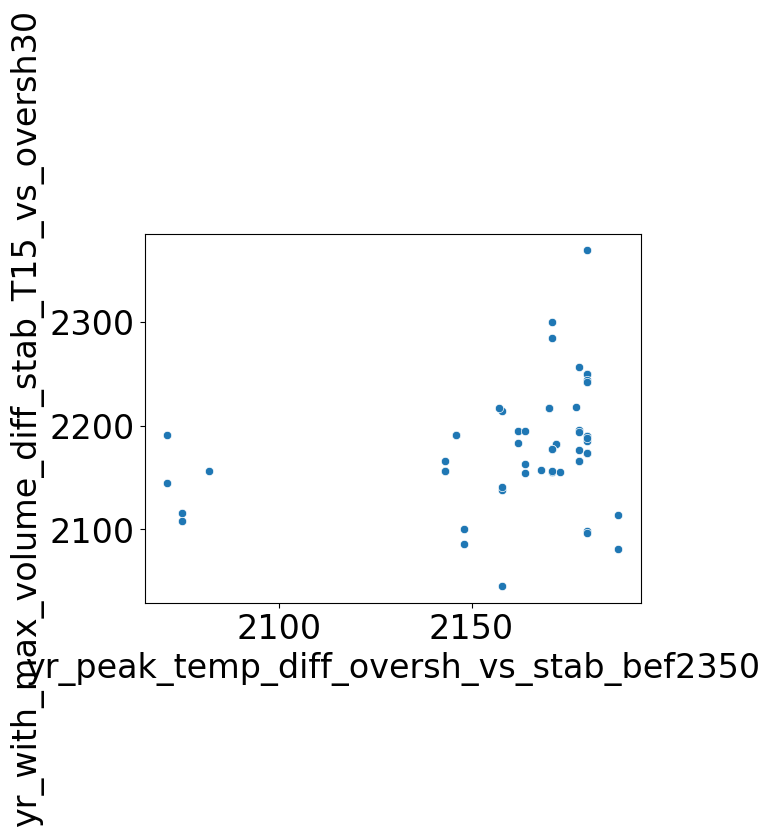

In [267]:
sns.scatterplot(data= water_trough_stats_basins, x='yr_peak_temp_diff_oversh_vs_stab_bef2350', y='yr_with_max_volume_diff_stab_T15_vs_oversh30')

<AxesSubplot:ylabel='peak_temp_diff_oversh_vs_stab_bef2350'>

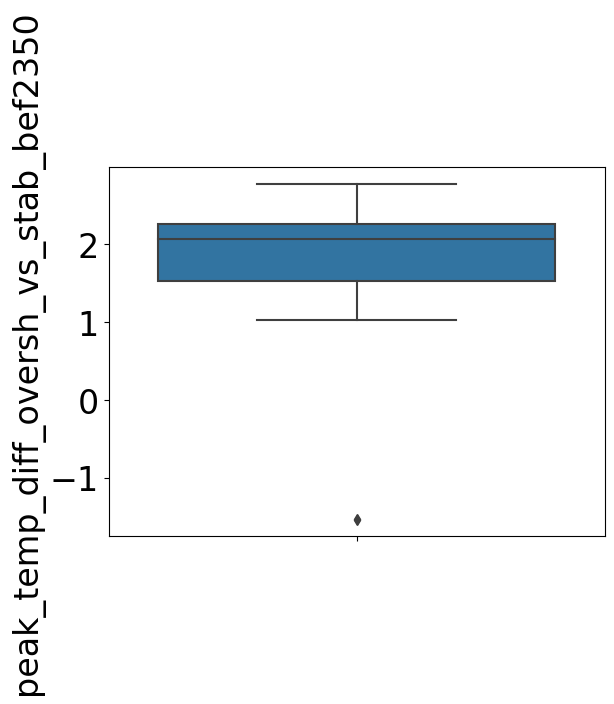

In [248]:
sns.boxplot(data= water_trough_stats_basins, y='peak_temp_diff_oversh_vs_stab_bef2350')

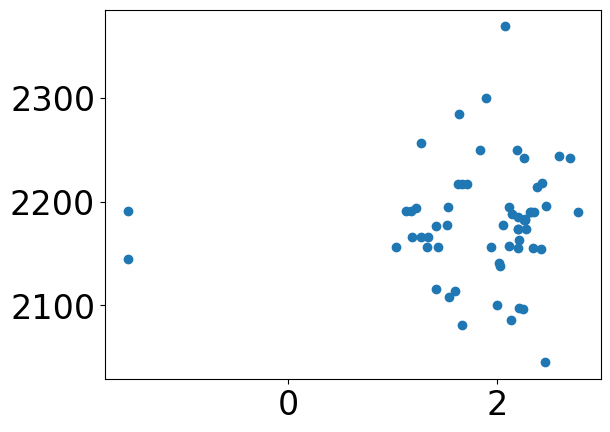

In [239]:
plt.plot(water_trough_stats_basins['peak_temp_diff_oversh_vs_stab_bef2350'], water_trough_stats_basins['yr_with_max_volume_diff_stab_T15_vs_oversh30'], 'o')

plt.plot(water_trough_stats_basins['peak_temp_diff_oversh_vs_stab_bef2350'], water_trough_stats_basins['yr_with_max_volume_diff_stab_T15_vs_oversh30'], 'o')

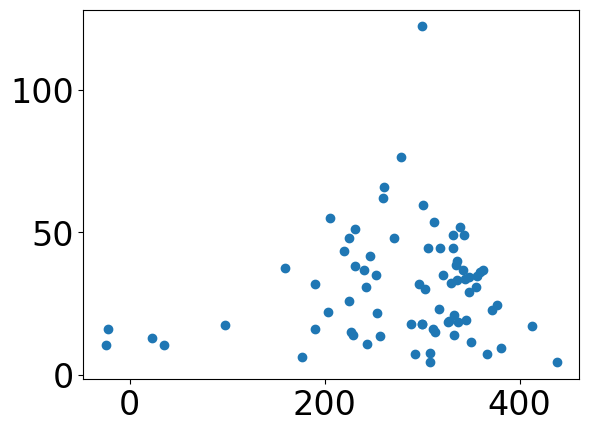

In [194]:
plt.plot(water_trough_stats_basins['peak_temp_diff_oversh_vs_stab_bef2350'], water_trough_stats_basins['max_volume_diff_perc_stab_T15_vs_oversh30'], 'o')

In [96]:
basin = '3403'
#region.unique()

In [102]:
pd_clim_sel_basin.scenario.unique()

array(['stab_T12', 'stab_T15', 'oversh_T20OS15', 'oversh_T25OS15',
       'oversh_T30OS15', 'stab_T20', 'stab_T25', 'stab_T30'], dtype=object)

2229

In [155]:
mean_precip_change_perc_oversh_stab_aft2350

0.8026379798178107

In [152]:
mean_precip_change_perc_oversh_stab_bef2350

1.4091887650353074

In [148]:
peak_temp_diff_oversh_stab_bef2350

1.0347746471776418

In [149]:
peak_precip_change_perc_oversh_stab_bef2350

7.059825263808617

In [150]:
peak_precip_change_perc_oversh_stab_aft2350

5.241463914815769

In [122]:
cumsum_precip_diff_oversh_stab_bef2300

4684.301788770532

In [123]:
cumsum_precip_diff_oversh_stab_aft2300

1277.7532853074458

In [90]:
water_trough_stats_basins

,yrs_with_water_trough,cumulative_runoff_diff_trough,water_trough_min_year,water_trough_max_diff,water_trough_start_end,basin_name
4110,NaN,NaN,NaN,NaN,NaN,NaN
4123,NaN,NaN,NaN,NaN,NaN,NaN
4125,184,1104.867,2368,8.377464294433594,2282.0_2465.0,NaN
4401,13,64.50666,2424,5.667045593261719,2417.0_2429.0,NaN
4406,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
3423,298,4701.5776,2173,25.726287841796875,2081.0_2458.0,RAPEL
3426,NaN,NaN,NaN,NaN,NaN,NaN
3428,274,3841.2285,2174,21.97225570678711,2071.0_2430.0,NaN
3429,222,2323.8857,2193,16.174705505371094,2085.0_2306.0,NaN


,yrs_with_water_trough,cumulative_runoff_diff_trough,water_trough_min_year,water_trough_max_diff,water_trough_start_end
2902,293,3904.2534,2322,19.000633239746094,2182.0_2474.0
2309,177,1231.7578,2351,10.177536010742188,2269.0_2445.0
2910,74,497.31525,2429,10.716346740722656,2233.0_2456.0
2919,342.0,1403.263306,NaN,NaN,NaN
2914,211,2831.3276,2339,22.31848907470703,2236.0_2470.0
3423,298,4701.5776,2173,25.726287841796875,2081.0_2458.0
2306,89,614.71075,2295,8.328994750976562,2275.0_2363.0
3425,NaN,NaN,NaN,NaN,NaN
2319,NaN,NaN,NaN,NaN,NaN
6243,138,672.8556,2201,6.99407958984375,2171.0_2308.0


### let's just choose the most arid basins and the most glaciated ones:

In [43]:
pd_basins_arid_glac = pd_basins.loc[(pd_basins.aridity_index<2) & (pd_basins.glaciated_perc >0.8)]


In [44]:
#pd_basin_num.index = pd_basin_num.RIVER_BASI

In [45]:
pd_basins_arid_glac_num = pd_basin_num.loc[pd_basins_arid_glac.index.values]

In [46]:
pd_basins_arid_glac_num['RGI6_vs_basin_area'] = 100*pd_basins_arid_glac_num['RGI_AREA']/pd_basins_arid_glac_num['AREA_CALC']

In [47]:
pd_basins_arid_glac_num['glaciated_perc'] = pd_basins_arid_glac.glaciated_perc
pd_basins_arid_glac_num['aridity_index'] = pd_basins_arid_glac.aridity_index

In [48]:
df_itmix = pd.read_hdf(oggm.utils.get_demo_file('rgi62_itmix_df.h5'))
print(len(df_itmix))
f = open('/home/www/fmaussion/misc/magicc/rgi_ids_per_basin.json')
t = json.load(f)

frgi = utils.file_downloader('https://cluster.klima.uni-bremen.de/~oggm/rgi/rgi62_stats.h5')
#frgi = '/home/users/lschuster/glacierMIP/rgi62_stats.h5'
odf = pd.read_hdf(frgi, index_col=0)
rgi_ids_per_basin_dict = {}
for basin in pd_basins_arid_glac_num.MRBID:

    rgis_basin = t[str(basin)]
    # remove connectivity level 2 glaciers only important for P03 (Greenland)
    rgis_basin = odf.loc[rgis_basin].loc[odf.loc[rgis_basin].Connect <2].index.values
    rgis_basin = list(set(rgis_basin))

    pd_basins_arid_glac_num.loc[pd_basins_arid_glac_num.MRBID==basin,'n glaciers'] = int(len(rgis_basin))
    vol_ratio = 100*df_itmix.loc[rgis_basin]['vol_itmix_m3'].sum()/df_itmix['vol_itmix_m3'].sum()
    pd_basins_arid_glac_num.loc[pd_basins_arid_glac_num.MRBID==basin,'Initial volume relative'] = vol_ratio

    rgi_ids_per_basin_dict[str(basin)] = rgis_basin
pd_basins_arid_glac_num['Initial volume relative'] = pd_basins_arid_glac_num['Initial volume relative'].round(2).values
pd_basins_arid_glac_num['n glaciers'] = pd_basins_arid_glac_num['n glaciers'].astype(int)

    #import dataframe_image as dfi
    #dfi.export(pd_provide_reg, "table_basin.png", table_conversion='matplotlib')

216502


In [49]:
len(rgi_ids_per_basin_dict['3423'])

246

In [50]:
pd_basins_arid_glac_num

,MRBID,RIVER_BASI,CONTINENT,OCEAN,SEA,AREA_CALC,Shape_Leng,Shape_Area,RGI_AREA,geometry,RGI6_vs_basin_area,glaciated_perc,aridity_index,n glaciers,Initial volume relative
INDUS,2309,INDUS,Asia,Indian Ocean,Arabian Sea,865012.6,81.286291,82.852275,27206.546,"MULTIPOLYGON (((67.44167 23.97006, 67.44028 23...",3.145220,2.361021,0.54,23424,1.49
TARIM,2914,TARIM HE (also TALIMU HE),Asia,---,---,1563201.7,93.222224,163.124573,26142.022,"POLYGON ((98.90833 38.28750, 98.88924 38.28715...",1.672338,2.343318,0.64,20791,1.22
ARAL SEA,2902,ARAL SEA,Asia,---,---,1372516.9,126.456933,146.833583,12558.726,"POLYGON ((60.03750 48.56250, 60.02674 48.56215...",0.915014,1.230728,0.45,16211,0.53
GANGES,2306,GANGES,Asia,Indian Ocean,Bay of Bengal,1006558.6,122.349983,90.946880,7906.081,"MULTIPOLYGON (((88.02555 21.57150, 88.02361 21...",0.785457,1.094819,0.78,6552,0.30
BALKHASH,2910,LAKE BALKHASH,Asia,---,---,414761.4,52.448948,47.963010,2328.337,"POLYGON ((81.64583 47.35833, 81.62258 47.35798...",0.561368,0.931272,0.55,3142,0.08
SALWEEN,2319,SALWEEN,Asia,Indian Ocean,Andaman Sea,266292.8,74.305674,23.925588,1265.390,"POLYGON ((94.15000 32.44583, 94.15221 32.44527...",0.475187,0.888248,1.80,2134,0.04
ISSYK-KUL,2919,YSYK-KOL (also ISSYK-KUL),Asia,---,---,21918.0,8.855285,2.401350,507.862,"POLYGON ((79.21667 42.41667, 79.21250 42.41667...",2.317100,0.878020,0.55,807,0.01
RHONE,6243,RHONE,Europe,Atlantic Ocean,Mediterranean Sea,96637.6,28.004916,11.197342,917.302,"POLYGON ((6.84167 47.82083, 6.84167 47.81667, ...",0.949219,0.927527,1.90,1169,0.04
RAPEL,3423,RAPEL,South America,Pacific Ocean,South Pacific,13784.5,6.920319,1.351493,234.273,"POLYGON ((-70.02917 -34.28750, -70.02864 -34.2...",1.699539,1.517624,0.67,246,0.01
SANTA,3425,SANTA,South America,Pacific Ocean,South Pacific,11979.2,8.161008,0.980699,354.427,"POLYGON ((-77.18750 -9.83750, -77.18715 -9.856...",2.958687,1.673961,1.50,409,0.01


In [51]:
water_trough_stats_basins.loc[pd_basins_arid_glac_num.MRBID.values.astype(str), 'basin_name'] = pd_basins_arid_glac_num.index

In [52]:
water_trough_stats_basins.loc[pd_basins_arid_glac_num.MRBID.values.astype(str)].dropna().sort_values(by='water_trough_max_diff')

,yrs_with_water_trough,cumulative_runoff_diff_trough,water_trough_min_year,water_trough_max_diff,water_trough_start_end,max_volume_diff_perc_stab_T15_vs_oversh30,yr_with_max_volume_diff_stab_T15_vs_oversh30,final_volume_diff_stab_T15_T30,basin_name
6243,138.0,672.8556,2201,6.994080,2171.0_2308.0,41.848953,2217.0,35.657036,RHONE
2306,89.0,614.71075,2295,8.328995,2275.0_2363.0,38.497173,2183.0,42.534599,GANGES
2309,177.0,1231.7578,2351,10.177536,2269.0_2445.0,30.702286,2218.0,40.473907,INDUS
2910,74.0,497.31525,2429,10.716347,2233.0_2456.0,44.399117,2163.0,51.054722,BALKHASH
2902,293.0,3904.2534,2322,19.000633,2182.0_2474.0,51.783379,2214.0,74.979805,ARAL SEA
2914,211.0,2831.3276,2339,22.318489,2236.0_2470.0,44.537819,2195.0,57.278992,TARIM
3423,298.0,4701.5776,2173,25.726288,2081.0_2458.0,59.652992,2300.0,84.155975,RAPEL


In [53]:
pd_basins_arid_glac_num = pd_basins_arid_glac_num.sort_values(by='aridity_index')

In [54]:
len(pd_basins_arid_glac_num.MRBID)

10

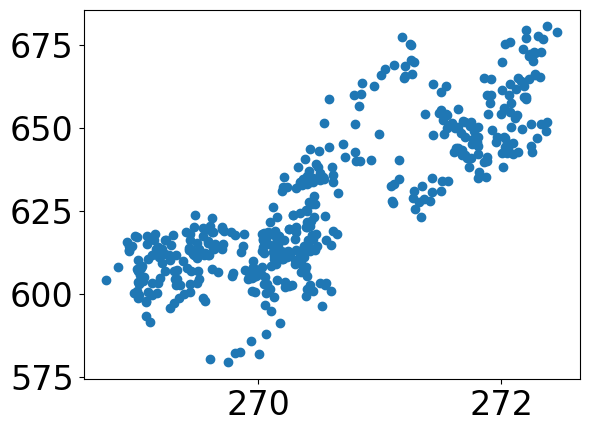

In [55]:
plt.plot(pd_clim_sel_basin_oversh['temp_20yr_avg'] , pd_clim_sel_basin_oversh['precip_20yr_avg'], 'o')

In [56]:

yrs_trough_water = pd_basin_sel_stab_T15_runoff.where(pd_basin_sel_stab_T15_runoff['runoff_rel_2000_2050_%'] - pd_basin_sel_oversh_T30OS15_runoff['runoff_rel_2000_2050_%'] > 5).dropna().index

NameError: name 'pd_basin_sel_stab_T15_runoff' is not defined

In [57]:
yrs_trough_water

NameError: name 'yrs_trough_water' is not defined

In [58]:
pd_basin_sel#['runoff_rel_2000_2050_%']

NameError: name 'pd_basin_sel' is not defined

In [59]:
condi_trough = water_trough_stats_basins_sel.yrs_with_water_trough>=20
water_trough_stats_basins_sel.loc[

SyntaxError: incomplete input (770297797.py, line 2)

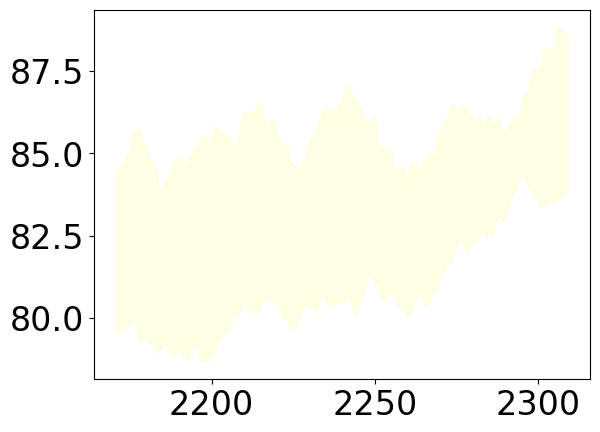

In [520]:
handles_x[-1]

no trough water: 2919
no trough water: 3425
no trough water: 2319


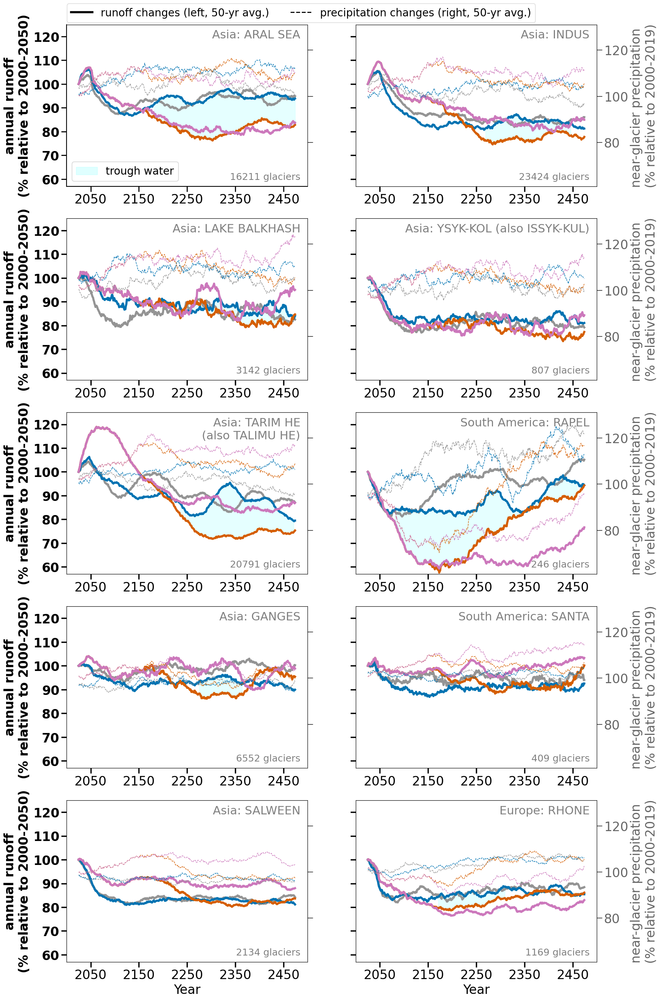

In [61]:
var = 'precip_50yr_avg'
basins = pd_basins_arid_glac_num.MRBID.values

plt.rc('font', size=24)

plt.figure(figsize=(18,32)) #, sharey=True, sharex=True)
plt.subplot(5,2,1)
ax = plt.gca()

ax.set_ylabel('annual runoff\n(% relative to 2000-2050)', weight='bold')

basin = basins[0]
basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0]#.split()#[0]
n_glaciers = pd_basins_arid_glac_num.loc[pd_basins_arid_glac_num.MRBID==int(basin), 'n glaciers'].values[0]
continent_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['CONTINENT'].values[0]#.split()#[0]
basin_name = f'{continent_n}: {basin_n}'
#ax.set_title(basin_name)
sns.lineplot(data=pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)],
             hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
             palette=color_scenario_poster.values(),
             hue_order=scenarios,lw=4, legend=True, alpha = 0.8,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_yticks(ticks=np.arange(0,150,10),
              labels=np.arange(0,150,10), weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in scenarios:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    if var == 'temp_20yr_avg':
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
    else:
        var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 1, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
if var != 'temp_20yr_avg':
    ticks = np.arange(80,131,20)
    ax2.set_yticks(ticks=ticks,
                    labels=ticks, alpha=0.6) 
else:
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)

plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])

ax.set_ylim([57,125]);
ax2.set_ylim([61,131]);


### add legends
handles, labels = ax.get_legend_handles_labels()
ax.get_legend().remove()
handles_2, labels_2 = ax2.get_legend_handles_labels()
leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], #title='Scenarios',
                fontsize=20, title_fontsize=22,loc = 'lower left', bbox_to_anchor=(-0.02,1.11), ncol=3)
for l in leg.get_lines():
    l.set_linewidth(4)
    

leg2 = ax.legend([handles[0], handles_2[0]], ['runoff changes (left, 50-yr avg.)',
                                              f'precipitation changes (right, 50-yr avg.)'],
                 loc='lower left', fontsize=20, bbox_to_anchor=(-0.02,0.98), ncol=2)
leg2.get_lines()[0].set_linewidth(4)
leg2.get_lines()[1].set_linewidth(2)
for l in leg2.get_lines():
    l.set_color('black')
# let's not show again the legend ...
#ax.add_artist(leg)

plt.text(0.97,0.97, basin_name,
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22, zorder=-1)

plt.text(0.97,0.03, f'{n_glaciers} glaciers',
     transform=ax.transAxes,ha='right',va='bottom',
     color='grey', fontsize=18, zorder=-1)

y0,y1 = water_trough_stats_basins['water_trough_start_end'].loc[str(basin)].split('_')
pd_basin_sel = pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)].dropna()
pd_basin_sel_stab_T15_runoff = pd_basin_sel.loc[pd_basin_sel.scenario=='stab_T15'] #['runoff_rel_2000_2050_%']
pd_basin_sel_stab_T15_runoff.index = pd_basin_sel_stab_T15_runoff.time
pd_basin_sel_oversh_T30OS15_runoff = pd_basin_sel.loc[pd_basin_sel.scenario=='oversh_T30OS15'] #['runoff_rel_2000_2050_%']
pd_basin_sel_oversh_T30OS15_runoff.index = pd_basin_sel_oversh_T30OS15_runoff.time

ax.fill_between(pd_basin_sel_stab_T15_runoff.loc[float(y0):float(y1)+1].time, 
                 pd_basin_sel_stab_T15_runoff.loc[float(y0):float(y1)+1]['runoff_rel_2000_2050_%'], 
                 pd_basin_sel_oversh_T30OS15_runoff.loc[float(y0):float(y1)+1]['runoff_rel_2000_2050_%'],
                 alpha = 0.1, color='cyan', zorder=-1, label='trough water')
handles_x, labels_x = ax.get_legend_handles_labels()
leg3 = ax.legend([handles_x[-1]], [labels_x[-1]], loc='lower left',fontsize=20)
ax.add_artist(leg3)
ax.add_artist(leg2)


for j, basin in enumerate(basins[1:]):
    basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0]#.split()[0]
    n_glaciers = pd_basins_arid_glac_num.loc[pd_basins_arid_glac_num.MRBID==int(basin), 'n glaciers'].values[0]
    if basin_n=='TARIM HE (also TALIMU HE)':
        basin_n = 'TARIM HE\n(also TALIMU HE)'
    continent_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['CONTINENT'].values[0]#.split()#[0]
    basin_name = f'{continent_n}: {basin_n}'
    plt.subplot(5,2,j+2)
    x_j = np.arange(1,20,2)
    x2_j = np.arange(0,20,2)

    ax = plt.gca()
    basin_runoff_sel = pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)]
    sns.lineplot(data=basin_runoff_sel,
             hue='scenario', x='time', y= 'runoff_rel_2000_2050_%',  
                 palette=list(color_scenario_poster.values()),
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)

    #ax.set_title(f'{Preg}: {basin}')

    plt.text(0.97,0.97, basin_name,
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22, zorder=-1)
    plt.text(0.97,0.03, f'{n_glaciers} glaciers',
         transform=ax.transAxes,ha='right',va='bottom',
         color='grey', fontsize=18, zorder=-1)

    if j in x_j:
        plt.ylabel(f'annual runoff\n(% relative to 2000-2050)', weight='bold')
        ax.set_yticks(ticks=np.arange(0,150,10),
                   labels=np.arange(0,150,10), weight='bold')
    else:
        plt.ylabel('')
        ax.set_yticks(ticks=np.arange(0,150,10),
                   labels=np.arange(0,150,10), alpha=0, fontsize=1) #visible=False) 
        #plt.setp(ax.get_yticklabels(), visible=False)

    #ax.set_ylim([70,1439.9]);


    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g
        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 1, 
                 ls = '--',
                 lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
    if var != 'temp_20yr_avg':
        ticks = np.arange(80,131,20)
        ax2.set_yticks(ticks=ticks,
                        labels=ticks, alpha=0.6)  
        ylabel = 'near-glacier precipitation \n(% relative to 2000-2019)' #, glacier-area weighted)'

    else:
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)
        ylabel = r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)'

    if j in x2_j:
        ax2.set_ylabel(ylabel,
                      alpha = 0.6)
        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    else:
        ax2.set_ylabel('')
        #ax2.set_yticks([])
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

    #ax2.set_ylim([-0.9,5.9]);

    if j >6:
        ax.set_xlabel('Year')
    else:
        ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_ylim([57,125]);
    ax2.set_ylim([61,131]);

    try:
        y0,y1 = water_trough_stats_basins['water_trough_start_end'].loc[str(basin)].split('_')
        pd_basin_sel = pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)].dropna()
        pd_basin_sel_stab_T15_runoff = pd_basin_sel.loc[pd_basin_sel.scenario=='stab_T15'] #['runoff_rel_2000_2050_%']
        pd_basin_sel_stab_T15_runoff.index = pd_basin_sel_stab_T15_runoff.time
        pd_basin_sel_oversh_T30OS15_runoff = pd_basin_sel.loc[pd_basin_sel.scenario=='oversh_T30OS15'] #['runoff_rel_2000_2050_%']
        pd_basin_sel_oversh_T30OS15_runoff.index = pd_basin_sel_oversh_T30OS15_runoff.time

        ax.fill_between(pd_basin_sel_stab_T15_runoff.loc[float(y0):float(y1)+1].time, 
                         pd_basin_sel_stab_T15_runoff.loc[float(y0):float(y1)+1]['runoff_rel_2000_2050_%'], 
                         pd_basin_sel_oversh_T30OS15_runoff.loc[float(y0):float(y1)+1]['runoff_rel_2000_2050_%'],
                         alpha = 0.1, color='cyan', zorder=-1)
    except:
        print(f'no trough water: {basin}')
#plt.tight_layout()
plt.savefig(f'figures/figures_basins/3_most_arid_glaciated_basin_50yr_avg_runoff_{bc}_vs_prcp_poster_iugg_precip_50yr_avg.png')
plt.savefig(f'figures/figures_basins/3_most_arid_glaciated_basin_50yr_avg_runoff_{bc}_vs_prcp_poster_iugg_precip_50yr_avg.pdf')


no trough water: 2919
no trough water: 3425
no trough water: 2319


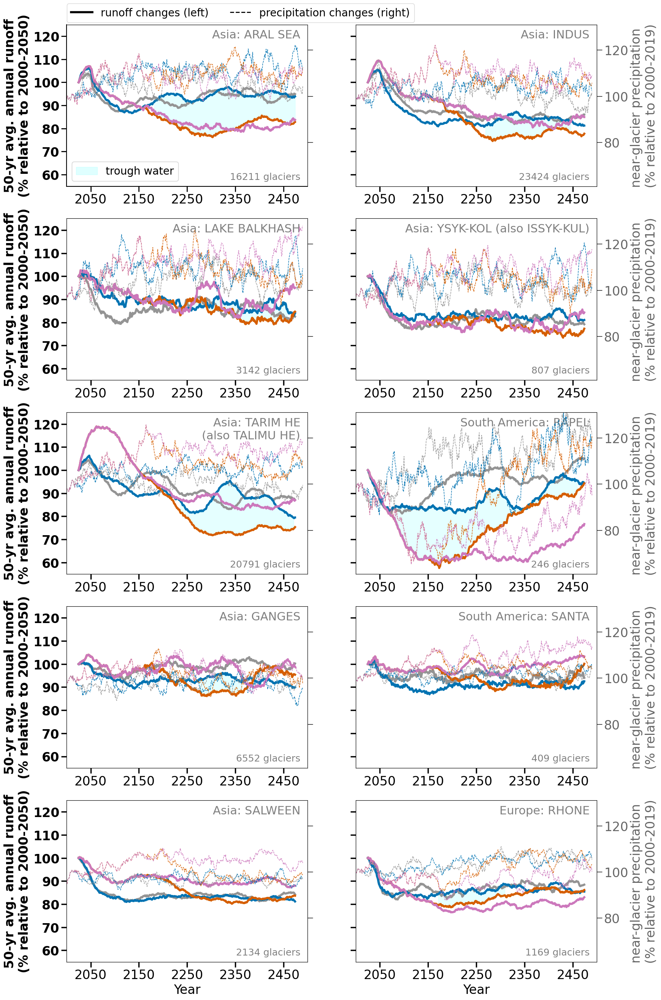

In [525]:
var = 'precip_20yr_avg'
basins = pd_basins_arid_glac_num.MRBID.values

plt.rc('font', size=24)

plt.figure(figsize=(18,32)) #, sharey=True, sharex=True)
plt.subplot(5,2,1)
ax = plt.gca()

ax.set_ylabel('50-yr avg. annual runoff\n(% relative to 2000-2050)', weight='bold')

basin = basins[0]
basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0]#.split()#[0]
n_glaciers = pd_basins_arid_glac_num.loc[pd_basins_arid_glac_num.MRBID==int(basin), 'n glaciers'].values[0]
continent_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['CONTINENT'].values[0]#.split()#[0]
basin_name = f'{continent_n}: {basin_n}'
#ax.set_title(basin_name)
sns.lineplot(data=pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)],
             hue='scenario', x='time', y= 'runoff_rel_2000_2050_%', 
             palette=color_scenario_poster.values(),
             hue_order=scenarios,lw=4, legend=True,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_yticks(ticks=np.arange(0,150,10),
              labels=np.arange(0,150,10), weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in scenarios:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    if var == 'temp_20yr_avg':
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
    else:
        var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 1, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
if var != 'temp_20yr_avg':
    ticks = np.arange(80,131,20)
    ax2.set_yticks(ticks=ticks,
                    labels=ticks, alpha=0.6) 
else:
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)

plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])

ax.set_ylim([55,125]);
ax2.set_ylim([61,131]);


### add legends
handles, labels = ax.get_legend_handles_labels()
ax.get_legend().remove()
handles_2, labels_2 = ax2.get_legend_handles_labels()
leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], #title='Scenarios',
                fontsize=20, title_fontsize=22,loc = 'lower left', bbox_to_anchor=(-0.02,1.11), ncol=3)
for l in leg.get_lines():
    l.set_linewidth(4)
    

leg2 = ax.legend([handles[0], handles_2[0]], ['runoff changes (left)',
                                              r'precipitation changes (right)'],
                 loc='lower left', fontsize=20, bbox_to_anchor=(-0.02,0.98), ncol=2)
leg2.get_lines()[0].set_linewidth(4)
leg2.get_lines()[1].set_linewidth(2)
for l in leg2.get_lines():
    l.set_color('black')
# let's not show again the legend ...
#ax.add_artist(leg)

plt.text(0.97,0.97, basin_name,
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22, zorder=-1)

plt.text(0.97,0.03, f'{n_glaciers} glaciers',
     transform=ax.transAxes,ha='right',va='bottom',
     color='grey', fontsize=18, zorder=-1)

y0,y1 = water_trough_stats_basins['water_trough_start_end'].loc[str(basin)].split('_')
pd_basin_sel = pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)].dropna()
pd_basin_sel_stab_T15_runoff = pd_basin_sel.loc[pd_basin_sel.scenario=='stab_T15'] #['runoff_rel_2000_2050_%']
pd_basin_sel_stab_T15_runoff.index = pd_basin_sel_stab_T15_runoff.time
pd_basin_sel_oversh_T30OS15_runoff = pd_basin_sel.loc[pd_basin_sel.scenario=='oversh_T30OS15'] #['runoff_rel_2000_2050_%']
pd_basin_sel_oversh_T30OS15_runoff.index = pd_basin_sel_oversh_T30OS15_runoff.time

ax.fill_between(pd_basin_sel_stab_T15_runoff.loc[float(y0):float(y1)+1].time, 
                 pd_basin_sel_stab_T15_runoff.loc[float(y0):float(y1)+1]['runoff_rel_2000_2050_%'], 
                 pd_basin_sel_oversh_T30OS15_runoff.loc[float(y0):float(y1)+1]['runoff_rel_2000_2050_%'],
                 alpha = 0.1, color='cyan', zorder=-1, label='trough water')
handles_x, labels_x = ax.get_legend_handles_labels()
leg3 = ax.legend([handles_x[-1]], [labels_x[-1]], loc='lower left',fontsize=20)
ax.add_artist(leg3)
ax.add_artist(leg2)


for j, basin in enumerate(basins[1:]):
    basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0]#.split()[0]
    n_glaciers = pd_basins_arid_glac_num.loc[pd_basins_arid_glac_num.MRBID==int(basin), 'n glaciers'].values[0]
    if basin_n=='TARIM HE (also TALIMU HE)':
        basin_n = 'TARIM HE\n(also TALIMU HE)'
    continent_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['CONTINENT'].values[0]#.split()#[0]
    basin_name = f'{continent_n}: {basin_n}'
    plt.subplot(5,2,j+2)
    x_j = np.arange(1,20,2)
    x2_j = np.arange(0,20,2)

    ax = plt.gca()
    basin_runoff_sel = pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)]
    sns.lineplot(data=basin_runoff_sel,
             hue='scenario', x='time', y= 'runoff_rel_2000_2050_%',  
                 palette=list(color_scenario_poster.values()),
             hue_order=scenarios,lw=4, legend=False,
             ax = ax)

    #ax.set_title(f'{Preg}: {basin}')

    plt.text(0.97,0.97, basin_name,
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22, zorder=-1)
    plt.text(0.97,0.03, f'{n_glaciers} glaciers',
         transform=ax.transAxes,ha='right',va='bottom',
         color='grey', fontsize=18, zorder=-1)

    if j in x_j:
        plt.ylabel(f'50-yr avg. annual runoff\n(% relative to 2000-2050)', weight='bold')
        ax.set_yticks(ticks=np.arange(0,150,10),
                   labels=np.arange(0,150,10), weight='bold')
    else:
        plt.ylabel('')
        ax.set_yticks(ticks=np.arange(0,150,10),
                   labels=np.arange(0,150,10), alpha=0, fontsize=1) #visible=False) 
        #plt.setp(ax.get_yticklabels(), visible=False)

    #ax.set_ylim([70,1439.9]);


    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g
        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 1, 
                 ls = '--',
                 lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
    if var != 'temp_20yr_avg':
        ticks = np.arange(80,131,20)
        ax2.set_yticks(ticks=ticks,
                        labels=ticks, alpha=0.6)  
        ylabel = 'near-glacier precipitation \n(% relative to 2000-2019)' #, glacier-area weighted)'

    else:
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)
        ylabel = r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)'

    if j in x2_j:
        ax2.set_ylabel(ylabel,
                      alpha = 0.6)
        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    else:
        ax2.set_ylabel('')
        #ax2.set_yticks([])
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=1)

    #ax2.set_ylim([-0.9,5.9]);

    if j >6:
        ax.set_xlabel('Year')
    else:
        ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_ylim([55,125]);
    ax2.set_ylim([61,131]);

    try:
        y0,y1 = water_trough_stats_basins['water_trough_start_end'].loc[str(basin)].split('_')
        pd_basin_sel = pd_runoff_scenario_rel_basin.loc[pd_runoff_scenario_rel_basin.basin == str(basin)].dropna()
        pd_basin_sel_stab_T15_runoff = pd_basin_sel.loc[pd_basin_sel.scenario=='stab_T15'] #['runoff_rel_2000_2050_%']
        pd_basin_sel_stab_T15_runoff.index = pd_basin_sel_stab_T15_runoff.time
        pd_basin_sel_oversh_T30OS15_runoff = pd_basin_sel.loc[pd_basin_sel.scenario=='oversh_T30OS15'] #['runoff_rel_2000_2050_%']
        pd_basin_sel_oversh_T30OS15_runoff.index = pd_basin_sel_oversh_T30OS15_runoff.time

        ax.fill_between(pd_basin_sel_stab_T15_runoff.loc[float(y0):float(y1)+1].time, 
                         pd_basin_sel_stab_T15_runoff.loc[float(y0):float(y1)+1]['runoff_rel_2000_2050_%'], 
                         pd_basin_sel_oversh_T30OS15_runoff.loc[float(y0):float(y1)+1]['runoff_rel_2000_2050_%'],
                         alpha = 0.1, color='cyan', zorder=-1)
    except:
        print(f'no trough water: {basin}')
#plt.tight_layout()
plt.savefig(f'figures/figures_basins/3_most_arid_glaciated_basin_50yr_avg_runoff_{bc}_vs_prcp_poster_iugg.png')
plt.savefig(f'figures/figures_basins/3_most_arid_glaciated_basin_50yr_avg_runoff_{bc}_vs_prcp_poster_iugg.pdf')


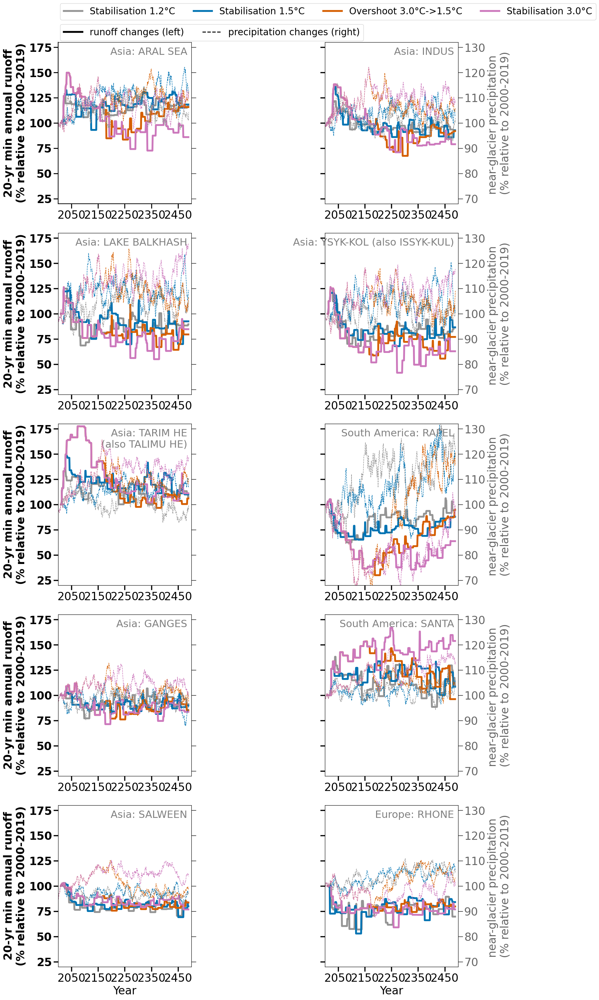

In [41]:
# same for 50-yr minimum anual runoff ... 

var = 'precip_20yr_avg'
basins = pd_basins_arid_glac_num.MRBID.values


plt.rc('font', size=24)

plt.figure(figsize=(16,30)) #, sharey=True, sharex=True)
plt.subplot(5,2,1)
ax = plt.gca()

ax.set_ylabel('20-yr min annual runoff\n(% relative to 2000-2019)', weight='bold')

basin = basins[0]
basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0]#.split()#[0]
continent_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['CONTINENT'].values[0]#.split()#[0]
basin_name = f'{continent_n}: {basin_n}'
#ax.set_title(basin_name)
sns.lineplot(data=pd_runoff_scenario_rel_basin_20_yr_min.loc[pd_runoff_scenario_rel_basin_20_yr_min.basin == str(basin)],
             hue='scenario', x='time', y= 'runoff_min_rel_2000_2020_%', 
             palette=color_scenario_poster.values(),
             hue_order=scenarios,lw=4, legend=True,
             ax = ax)
#ax.set_xlabel('Year')
#ax.grid(axis='x')
ax.set_yticks(ticks=[0,25,50,75,100,125, 150, 175],
                   labels=[0,25,50,75,100,125, 150, 175], weight='bold')

for axis in 'left', 'bottom':
    ax.spines[axis].set_linewidth(1.5)

# set the parameters for both axis: label size in font points, the line tick line 
# width and length in pixels
ax.tick_params(axis='both', which='major', width=2, length=10)
ax2 = ax.twinx()  
for scenario in scenarios:
                #'stab_T30']:

    pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
    pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
    pd_clim_scenario_g.index = pd_clim_scenario_g.year
    temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
    if var == 'temp_20yr_avg':
        var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
    else:
        var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

    ax2.plot(pd_clim_scenario_g.year,
             var_g_to_ref,
             alpha = 1, 
             ls = '--',
             lw=1, color = color_scenario[scenario], label=label_scenario[scenario])
ax2.set_ylabel('')
if var != 'temp_20yr_avg':
    ticks = np.arange(70,131,10)
    ax2.set_yticks(ticks=ticks,
                    labels=ticks, alpha=0.6) 
else:
    ax2.set_yticks(ticks=[0,1,2,3,4,5],
               labels=[0,1,2,3,4,5], alpha=0.6)

ax2.set_ylim([68,132]);

plt.setp(ax2.get_yticklabels(), visible=False, fontsize=10)
ax.set_xlabel('')
ax.set_xlim([2000,2500])
ax2.set_xlim([2000,2500])
ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
ax.set_ylim([20,180]);


### add legends
handles, labels = ax.get_legend_handles_labels()
ax.get_legend().remove()
handles_2, labels_2 = ax2.get_legend_handles_labels()
leg = ax.legend(handles[:len(scenarios)], labels_2[:len(scenarios)], #title='Scenarios',
                fontsize=20, title_fontsize=22,loc = 'lower left', bbox_to_anchor=(-0.02,1.11), ncol=4)
for l in leg.get_lines():
    l.set_linewidth(4)
    

leg2 = ax.legend([handles[0], handles_2[0]], ['runoff changes (left)',
                                              r'precipitation changes (right)'],
                 loc='lower left', fontsize=20, bbox_to_anchor=(-0.02,0.98), ncol=2)
leg2.get_lines()[0].set_linewidth(4)
leg2.get_lines()[1].set_linewidth(2)
for l in leg2.get_lines():
    l.set_color('black')
ax.add_artist(leg)

plt.text(0.97,0.97, basin_name,
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22, zorder=-1)


for j, basin in enumerate(basins[1:]):
    basin_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['RIVER_BASI'].values[0]#.split()[0]
    if basin_n=='TARIM HE (also TALIMU HE)':
        basin_n = 'TARIM HE\n(also TALIMU HE)'
    continent_n = pd_basin_num.loc[pd_basin_num.MRBID==int(basin)]['CONTINENT'].values[0]#.split()#[0]
    basin_name = f'{continent_n}: {basin_n}'
    plt.subplot(5,2,j+2)
    x_j = np.arange(1,20,2)
    x2_j = np.arange(0,20,2)

    ax = plt.gca()
    sns.lineplot(data=pd_runoff_scenario_rel_basin_20_yr_min.loc[pd_runoff_scenario_rel_basin_20_yr_min.basin == str(basin)],
                 hue='scenario', x='time', y= 'runoff_min_rel_2000_2020_%', 
                 palette=color_scenario_poster.values(),
                 hue_order=scenarios,lw=4, legend=False,
                 ax = ax)

    #ax.set_title(f'{Preg}: {basin}')

    plt.text(0.97,0.97, basin_name,
             transform=ax.transAxes,ha='right',va='top',
             color='grey', fontsize=22, zorder=-1)

    if j in x_j:
        #plt.ylabel(f'50-yr avg. annual runoff\n(% relative to 2000-2050)', weight='bold')
        plt.ylabel('20-yr min annual runoff\n(% relative to 2000-2019)', weight='bold')
        ax.set_yticks(ticks=[0,25,50,75,100,125, 150, 175],
                   labels=[0,25,50,75,100,125, 150, 175], weight='bold')
    else:
        plt.ylabel('')
        ax.set_yticks(ticks=[0,25,50,75,100,125, 150, 175],
                   labels=['','','','','','','',''], weight='bold')
        #ax.set_yticklabels([])
        #ax.set_yticks(ticks=[0,25,50,75,100,125, 150, 175],
        #           labels=[0,25,50,75,100,125, 150, 175], weight='bold')

    #ax.set_ylim([70,1439.9]);


    ax.tick_params(axis='both', which='major', width=2.5, length=10)
    ax2 = ax.twinx()  
    for scenario in scenarios:
                    #'stab_T30']:

        pd_clim_scenario = pd_clim_all.loc[pd_clim_all.scenario==scenario]
        pd_clim_scenario_g = pd_clim_scenario.loc[pd_clim_scenario.region == f'basin_{basin}_glacier']
        pd_clim_scenario_g.index = pd_clim_scenario_g.year
        temp_ref_g, precip_ref_g = pd_clim_scenario_g.loc[2000:2019][['temp','precip']].mean()
        if var == 'temp_20yr_avg':
            var_g_to_ref = pd_clim_scenario_g[var] - temp_ref_g
        else:
            var_g_to_ref = 100*pd_clim_scenario_g[var]/precip_ref_g

        ax2.plot(pd_clim_scenario_g.year,
                 var_g_to_ref,
                 alpha = 1, 
                 ls = '--',
                 lw=1, color = color_scenario_poster[scenario], label=label_scenario[scenario])
    if var != 'temp_20yr_avg':
        ticks = np.arange(70,131,10)
        ax2.set_yticks(ticks=ticks,
                        labels=ticks, alpha=0.6)  
        ylabel = 'near-glacier precipitation \n(% relative to 2000-2019)' #, glacier-area weighted)'

    else:
        ax2.set_yticks(ticks=[0,1,2,3,4,5],
                   labels=[0,1,2,3,4,5], alpha=0.6)
        ylabel = r'$\Delta$T'+'(°C) relative to 2000-2019\n(glacier-area weighted)'

    if j in x2_j:
        ax2.set_ylabel(ylabel,
                      alpha = 0.6)
        #ax2.set_yticks(labels=[0,1,2,3,4], alpha=0.6)
    else:
        ax2.set_ylabel('')
        #ax2.set_yticks([])
        plt.setp(ax2.get_yticklabels(), visible=False, fontsize=10)

    #ax2.set_ylim([-0.9,5.9]);
    ax2.set_ylim([68,132]);

    if j >6:
        ax.set_xlabel('Year')
    else:
        ax.set_xlabel('')
    ax.set_xlim([2000,2500])
    ax.set_xticks([2050,2150,2250,2350,2450],[2050,2150,2250,2350,2450])
    ax2.set_xlim([2000,2500])
    ax2.tick_params(axis='both', which='major', width=1, length=10, grid_alpha =0.6)
    ax.set_ylim([20,180]);
#plt.tight_layout()
plt.savefig(f'figures/figures_basins/3_most_arid_glaciated_basin_20_yr_min_runoff_{bc}_vs_prcp_poster_iugg.png')


In [15]:
pd_basins.aridity_index.min()

0.45

In [16]:
pd_basins.loc[(pd_basins.aridity_index<4) & (pd_basins.glaciated_perc >2)]

,basin_glacier_area_km2,basin_total_area_km2,aridity_index,glaciated_perc
INDUS,26893.8,1139075,0.54,2.361021
TARIM,24645.4,1051731,0.64,2.343318
BRAHMAPUTRA,16606.7,518011,2.70,3.205859
SANTA CRUZ,3027.8,30599,3.47,9.895095
SKAGIT,159.5,7961,2.36,2.003517


,basin_glacier_area_km2,basin_total_area_km2,aridity_index,glaciated_perc
INDUS,26893.8,1139075,0.54,2.361021
TARIM,24645.4,1051731,0.64,2.343318
BRAHMAPUTRA,16606.7,518011,2.70,3.205859
ARAL SEA,15176.7,1233148,0.45,1.230728
COPPER,12998.0,64959,8.98,20.009544
GANGES,11216.0,1024462,0.78,1.094819
YUKON,9535.4,829632,2.95,1.149353
ALSEK,5614.8,28422,8.46,19.755119
SUSITNA,4304.0,49470,5.54,8.700222
STIKINE,3467.6,51147,6.18,6.779674
